# Data Fetching, Cleaning and Preprocessing


In [1]:
pip install yfinance

Note: you may need to restart the kernel to use updated packages.


In [2]:
import yfinance as yf
import os
from datetime import datetime

# Directory to save the data files
data_dir = "commodity_data"
os.makedirs(data_dir, exist_ok=True)

# Define the commodities and their Yahoo Finance ticker symbols
commodities = {
    "crude_oil": "CL=F",    # Crude Oil Futures
    "coffee": "KC=F",       # Coffee Futures
    "natural_gas": "NG=F",  # Natural Gas Futures
    "gold": "GC=F",         # Gold Futures
    "wheat": "ZW=F",        # Wheat Futures
    "cotton": "CT=F",       # Cotton Futures
    "corn": "ZC=F",         # Corn Futures
    "sugar": "SB=F",        # Sugar Futures
    "silver": "SI=F",       # Silver Futures
    "copper": "HG=F",       # Copper Futures
}

# Define the date range for historical data
start_date = "2014-01-01"
end_date = datetime.now().strftime("%Y-%m-%d")

# Function to fetch and save data for each commodity
def fetch_and_save_commodity_data(ticker, commodity_name):
    print(f"Fetching data for {commodity_name}...")
    try:
        # Fetch the historical data
        data = yf.download(ticker, start=start_date, end=end_date)

        # Check if data was retrieved
        if not data.empty:
            # Save to CSV file
            file_path = os.path.join(data_dir, f"{commodity_name}.csv")
            data.to_csv(file_path)
            print(f"Data for {commodity_name} saved to {file_path}")
        else:
            print(f"No data found for {commodity_name}.")

    except Exception as e:
        print(f"An error occurred while fetching data for {commodity_name}: {e}")

# Fetch data for each commodity in the list
for commodity_name, ticker in commodities.items():
    fetch_and_save_commodity_data(ticker, commodity_name)

print("Data collection complete.")

Fetching data for crude_oil...


[*********************100%***********************]  1 of 1 completed


Data for crude_oil saved to commodity_data/crude_oil.csv
Fetching data for coffee...


[*********************100%***********************]  1 of 1 completed


Data for coffee saved to commodity_data/coffee.csv
Fetching data for natural_gas...


[*********************100%***********************]  1 of 1 completed


Data for natural_gas saved to commodity_data/natural_gas.csv
Fetching data for gold...


[*********************100%***********************]  1 of 1 completed


Data for gold saved to commodity_data/gold.csv
Fetching data for wheat...


[*********************100%***********************]  1 of 1 completed


Data for wheat saved to commodity_data/wheat.csv
Fetching data for cotton...


[*********************100%***********************]  1 of 1 completed


Data for cotton saved to commodity_data/cotton.csv
Fetching data for corn...


[*********************100%***********************]  1 of 1 completed


Data for corn saved to commodity_data/corn.csv
Fetching data for sugar...


[*********************100%***********************]  1 of 1 completed


Data for sugar saved to commodity_data/sugar.csv
Fetching data for silver...


[*********************100%***********************]  1 of 1 completed


Data for silver saved to commodity_data/silver.csv
Fetching data for copper...


[*********************100%***********************]  1 of 1 completed

Data for copper saved to commodity_data/copper.csv
Data collection complete.


Data cleaning and preprocessing


In [3]:
import pandas as pd
import os

# Directory containing the saved data files
data_dir = "commodity_data"

# List of commodities, matching file names created in the previous code
commodities = [
    "crude_oil", "coffee", "natural_gas", "gold", "wheat",
    "cotton", "corn", "sugar", "silver", "copper"
]

# Function to load and display the data for each commodity
def display_commodity_data(commodity_name):
    file_path = os.path.join(data_dir, f"{commodity_name}.csv")

    # Check if the file exists
    if os.path.exists(file_path):
        # Load the data
        df = pd.read_csv(file_path)

        # Display the first few rows of the data
        print(f"\nData for {commodity_name.capitalize()}:\n")
        print(df.head(), "\n")  # Display the first 5 rows
    else:
        print(f"No data file found for {commodity_name}.")

# Display data for each commodity
for commodity_name in commodities:
    display_commodity_data(commodity_name)



Data for Crude_oil:

         Date       Open       High        Low      Close  Adj Close  Volume
0  2014-01-02  98.500000  98.970001  95.339996  95.440002  95.440002  251248
1  2014-01-03  95.470001  95.739998  93.860001  93.959999  93.959999  215522
2  2014-01-06  94.180000  94.589996  93.199997  93.430000  93.430000  189379
3  2014-01-07  93.599998  94.220001  93.349998  93.669998  93.669998  177182
4  2014-01-08  93.959999  94.180000  92.260002  92.330002  92.330002  244855 


Data for Coffee:

         Date        Open        High         Low       Close   Adj Close  \
0  2014-01-02  111.050003  112.300003  110.199997  111.400002  111.400002   
1  2014-01-03  111.500000  116.550003  111.199997  116.349998  116.349998   
2  2014-01-06  116.500000  121.449997  115.699997  121.000000  121.000000   
3  2014-01-07  121.500000  122.599998  116.650002  117.250000  117.250000   
4  2014-01-08  117.550003  121.500000  117.550003  120.900002  120.900002   

   Volume  
0   10615  
1   1590

In [4]:
import pandas as pd
import os

# Directory containing the saved data files
data_dir = "commodity_data"
commodity_files = [f for f in os.listdir(data_dir) if f.endswith(".csv") and "_cleaned" not in f and "_features" not in f]  # Skip files with '_cleaned.csv'

def clean_commodity_data(file_path, commodity_name):
    print(f"Cleaning data for {commodity_name} from {file_path}...")

    # Load the CSV file into a DataFrame
    df = pd.read_csv(file_path, skiprows=2)  # Skip first 2 rows with unnecessary data

    # Ensure correct column headers
    expected_columns = ["Date", "Open", "High", "Low", "Close", "Adj Close", "Volume"]
    df.columns = expected_columns

    # Drop rows where 'Date' is NaN (noise rows)
    df = df.dropna(subset=["Date"])

    # Convert the 'Date' column to datetime format
    df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
    df = df.dropna(subset=["Date"])  # Drop rows where Date conversion failed

    # Ensure numeric values in price and volume columns, coercing errors to NaN and then dropping
    for column in ["Open", "High", "Low", "Close", "Adj Close", "Volume"]:
        df[column] = pd.to_numeric(df[column], errors='coerce')

    # Drop rows with any remaining NaN values
    df = df.dropna()

    # Remove duplicates by 'Date' and keep the first instance
    df = df.drop_duplicates(subset="Date", keep="first")

    # Save the cleaned data back to the CSV file
    cleaned_file_path = os.path.join(data_dir, f"{commodity_name}_cleaned.csv")
    df.to_csv(cleaned_file_path, index=False)
    print(f"Cleaned data saved for {commodity_name} at {cleaned_file_path}.")

# Process each file in the directory, skipping already cleaned files
for file_name in commodity_files:
    commodity_name = file_name.replace(".csv", "")  # Extract commodity name from file name
    file_path = os.path.join(data_dir, file_name)
    clean_commodity_data(file_path, commodity_name)

print("\nData cleaning complete for all commodities.")


Cleaning data for crude_oil from commodity_data/crude_oil.csv...
Cleaned data saved for crude_oil at commodity_data/crude_oil_cleaned.csv.
Cleaning data for gold from commodity_data/gold.csv...
Cleaned data saved for gold at commodity_data/gold_cleaned.csv.
Cleaning data for silver from commodity_data/silver.csv...
Cleaned data saved for silver at commodity_data/silver_cleaned.csv.
Cleaning data for copper from commodity_data/copper.csv...
Cleaned data saved for copper at commodity_data/copper_cleaned.csv.
Cleaning data for cotton from commodity_data/cotton.csv...
Cleaned data saved for cotton at commodity_data/cotton_cleaned.csv.
Cleaning data for coffee from commodity_data/coffee.csv...
Cleaned data saved for coffee at commodity_data/coffee_cleaned.csv.
Cleaning data for wheat from commodity_data/wheat.csv...
Cleaned data saved for wheat at commodity_data/wheat_cleaned.csv.
Cleaning data for sugar from commodity_data/sugar.csv...
Cleaned data saved for sugar at commodity_data/sugar_c

In [5]:
import pandas as pd
import os

# Directory containing the cleaned data files
data_dir = "commodity_data"

# List of cleaned files for each commodity, assuming the suffix "_cleaned.csv" for cleaned data
commodity_files = [f for f in os.listdir(data_dir) if f.endswith("_cleaned.csv")]

def display_cleaned_data(file_path, commodity_name):
    # Load the cleaned CSV file
    df = pd.read_csv(file_path)

    # Display the first few rows to verify the data structure
    print(f"\nCleaned Data for {commodity_name.capitalize()}:\n")
    print(df.head(), "\n")  # Display the first 5 rows

# Loop through each cleaned file and display data
for file_name in commodity_files:
    commodity_name = file_name.replace("_cleaned.csv", "")  # Extract commodity name from file name
    file_path = os.path.join(data_dir, file_name)
    display_cleaned_data(file_path, commodity_name)

print("Data display complete for all commodities.")



Cleaned Data for Crude_oil:

         Date       Open       High        Low      Close  Adj Close  Volume
0  2014-01-06  94.180000  94.589996  93.199997  93.430000  93.430000  189379
1  2014-01-07  93.599998  94.220001  93.349998  93.669998  93.669998  177182
2  2014-01-08  93.959999  94.180000  92.260002  92.330002  92.330002  244855
3  2014-01-09  92.580002  92.930000  91.239998  91.660004  91.660004  255784
4  2014-01-10  92.300003  93.379997  91.989998  92.720001  92.720001  255988 


Cleaned Data for Wheat:

         Date   Open    High     Low   Close  Adj Close  Volume
0  2014-01-06  608.0  612.75  605.00  605.75     605.75   39432
1  2014-01-07  606.5  610.00  601.75  602.50     602.50   45799
2  2014-01-08  603.0  607.25  586.75  588.75     588.75   55310
3  2014-01-09  588.0  591.00  578.50  584.25     584.25   67643
4  2014-01-10  584.5  593.25  560.50  569.00     569.00  110226 


Cleaned Data for Sugar:

         Date   Open       High    Low      Close  Adj Close  Volume

In [6]:
import pandas as pd
import os

# Directory containing the cleaned data files
data_dir = "commodity_data"

# List of cleaned files for each commodity
commodity_files = [f for f in os.listdir(data_dir) if f.endswith("_cleaned.csv")]

def modify_columns(file_path, commodity_name):
    print(f"Modifying columns for {commodity_name} data...")

    # Load the cleaned CSV file into a DataFrame
    df = pd.read_csv(file_path)

    # Drop the 'Close' column
    if 'Close' in df.columns:
        df = df.drop(columns=['Close'])

    # Rename 'Adj Close' to 'Close'
    if 'Adj Close' in df.columns:
        df = df.rename(columns={'Adj Close': 'Close'})

    # Save the modified data back to the CSV file
    df.to_csv(file_path, index=False)
    print(f"Columns modified and data saved for {commodity_name}.")

# Process each cleaned file
for file_name in commodity_files:
    commodity_name = file_name.replace("_cleaned.csv", "")  # Extract commodity name from file name
    file_path = os.path.join(data_dir, file_name)
    modify_columns(file_path, commodity_name)

print("Column modifications complete for all commodities.")


Modifying columns for crude_oil data...
Columns modified and data saved for crude_oil.
Modifying columns for wheat data...
Columns modified and data saved for wheat.
Modifying columns for sugar data...
Columns modified and data saved for sugar.
Modifying columns for coffee data...
Columns modified and data saved for coffee.
Modifying columns for copper data...
Columns modified and data saved for copper.
Modifying columns for corn data...
Columns modified and data saved for corn.
Modifying columns for gold data...
Columns modified and data saved for gold.
Modifying columns for cotton data...
Columns modified and data saved for cotton.
Modifying columns for silver data...
Columns modified and data saved for silver.
Modifying columns for natural_gas data...
Columns modified and data saved for natural_gas.
Column modifications complete for all commodities.


In [7]:
import pandas as pd
import os

# Directory containing the cleaned data files
data_dir = "commodity_data"

# List of cleaned files for each commodity, assuming the suffix "_cleaned.csv" for cleaned data
commodity_files = [f for f in os.listdir(data_dir) if f.endswith("_cleaned.csv")]

def display_final_cleaned_data(file_path, commodity_name):
    # Load the cleaned CSV file
    df = pd.read_csv(file_path)

    # Display the first few rows to verify the data structure
    print(f"\nFinal Cleaned Data for {commodity_name.capitalize()}:\n")
    print(df.head(), "\n")  # Display the first 5 rows

# Loop through each cleaned file and display data
for file_name in commodity_files:
    commodity_name = file_name.replace("_cleaned.csv", "")  # Extract commodity name from file name
    file_path = os.path.join(data_dir, file_name)
    display_final_cleaned_data(file_path, commodity_name)

print("Final cleaned data display complete for all commodities.")



Final Cleaned Data for Crude_oil:

         Date       Open       High        Low      Close  Volume
0  2014-01-06  94.180000  94.589996  93.199997  93.430000  189379
1  2014-01-07  93.599998  94.220001  93.349998  93.669998  177182
2  2014-01-08  93.959999  94.180000  92.260002  92.330002  244855
3  2014-01-09  92.580002  92.930000  91.239998  91.660004  255784
4  2014-01-10  92.300003  93.379997  91.989998  92.720001  255988 


Final Cleaned Data for Wheat:

         Date   Open    High     Low   Close  Volume
0  2014-01-06  608.0  612.75  605.00  605.75   39432
1  2014-01-07  606.5  610.00  601.75  602.50   45799
2  2014-01-08  603.0  607.25  586.75  588.75   55310
3  2014-01-09  588.0  591.00  578.50  584.25   67643
4  2014-01-10  584.5  593.25  560.50  569.00  110226 


Final Cleaned Data for Sugar:

         Date   Open       High    Low      Close  Volume
0  2014-01-06  16.08  16.160000  15.97  16.080000   36188
1  2014-01-07  16.10  16.190001  15.98  16.059999   42478
2  2014-

In [8]:
import pandas as pd
import os

# Directory containing the cleaned data files
data_dir = "commodity_data"

# List of cleaned files for each commodity
commodity_files = [f for f in os.listdir(data_dir) if f.endswith("_cleaned.csv")]

def format_date_column(file_path, commodity_name):
    print(f"Formatting date column for {commodity_name} data...")

    # Load the cleaned CSV file
    df = pd.read_csv(file_path)

    # Convert the 'Date' column to datetime, then remove the time part by formatting
    df['Date'] = pd.to_datetime(df['Date']).dt.date  # Keep only the date part

    # Save the modified data back to the CSV file
    df.to_csv(file_path, index=False)
    print(f"Date column formatted and data saved for {commodity_name}.")

# Process each cleaned file
for file_name in commodity_files:
    commodity_name = file_name.replace("_cleaned.csv", "")  # Extract commodity name from file name
    file_path = os.path.join(data_dir, file_name)
    format_date_column(file_path, commodity_name)

print("Date formatting complete for all commodities.")


Formatting date column for crude_oil data...
Date column formatted and data saved for crude_oil.
Formatting date column for wheat data...
Date column formatted and data saved for wheat.
Formatting date column for sugar data...
Date column formatted and data saved for sugar.
Formatting date column for coffee data...
Date column formatted and data saved for coffee.
Formatting date column for copper data...
Date column formatted and data saved for copper.
Formatting date column for corn data...
Date column formatted and data saved for corn.
Formatting date column for gold data...
Date column formatted and data saved for gold.
Formatting date column for cotton data...
Date column formatted and data saved for cotton.
Formatting date column for silver data...
Date column formatted and data saved for silver.
Formatting date column for natural_gas data...
Date column formatted and data saved for natural_gas.
Date formatting complete for all commodities.


In [9]:
import pandas as pd
import os

# Directory containing the cleaned data files
data_dir = "commodity_data"

# List of cleaned files for each commodity, assuming the suffix "_cleaned.csv" for cleaned data
commodity_files = [f for f in os.listdir(data_dir) if f.endswith("_cleaned.csv")]

def display_final_cleaned_data(file_path, commodity_name):
    # Load the cleaned CSV file
    df = pd.read_csv(file_path)

    # Display the first few rows to verify the data structure
    print(f"\nFinal Cleaned Data for {commodity_name.capitalize()}:\n")
    print(df.head(), "\n")  # Display the first 5 rows

# Loop through each cleaned file and display data
for file_name in commodity_files:
    commodity_name = file_name.replace("_cleaned.csv", "")  # Extract commodity name from file name
    file_path = os.path.join(data_dir, file_name)
    display_final_cleaned_data(file_path, commodity_name)

print("Final cleaned data display complete for all commodities.")



Final Cleaned Data for Crude_oil:

         Date       Open       High        Low      Close  Volume
0  2014-01-06  94.180000  94.589996  93.199997  93.430000  189379
1  2014-01-07  93.599998  94.220001  93.349998  93.669998  177182
2  2014-01-08  93.959999  94.180000  92.260002  92.330002  244855
3  2014-01-09  92.580002  92.930000  91.239998  91.660004  255784
4  2014-01-10  92.300003  93.379997  91.989998  92.720001  255988 


Final Cleaned Data for Wheat:

         Date   Open    High     Low   Close  Volume
0  2014-01-06  608.0  612.75  605.00  605.75   39432
1  2014-01-07  606.5  610.00  601.75  602.50   45799
2  2014-01-08  603.0  607.25  586.75  588.75   55310
3  2014-01-09  588.0  591.00  578.50  584.25   67643
4  2014-01-10  584.5  593.25  560.50  569.00  110226 


Final Cleaned Data for Sugar:

         Date   Open       High    Low      Close  Volume
0  2014-01-06  16.08  16.160000  15.97  16.080000   36188
1  2014-01-07  16.10  16.190001  15.98  16.059999   42478
2  2014-

# Exploratory Data Analysis (EDA)

In [10]:
import pandas as pd
import os

# Directory containing the cleaned data files
data_dir = "commodity_data"

# List of cleaned files for each commodity
commodity_files = [f for f in os.listdir(data_dir) if f.endswith("_cleaned.csv")]

# Function to load and display summary statistics for each commodity
def summary_statistics(file_path, commodity_name):
    df = pd.read_csv(file_path)

    # Calculate summary statistics
    stats = df[['Open', 'High', 'Low', 'Close', 'Volume']].describe()

    print(f"\nSummary Statistics for {commodity_name.capitalize()}:\n")
    print(stats)

# Display summary statistics for each commodity
for file_name in commodity_files:
    commodity_name = file_name.replace("_cleaned.csv", "")  # Extract commodity name from file name
    file_path = os.path.join(data_dir, file_name)
    summary_statistics(file_path, commodity_name)

print("Summary statistics complete for all commodities.")



Summary Statistics for Crude_oil:

              Open         High          Low        Close        Volume
count  2758.000000  2758.000000  2758.000000  2758.000000  2.758000e+03
mean     64.825319    65.870787    63.695127    64.783354  4.440181e+05
std      19.820012    19.984584    19.665429    19.850687  2.160666e+05
min     -14.000000    13.690000   -40.320000   -37.630001  0.000000e+00
25%      49.427499    50.222501    48.635001    49.457500  2.935558e+05
50%      62.619999    63.570000    61.670000    62.730000  4.005230e+05
75%      77.967501    78.919998    76.659998    77.910004  5.805928e+05
max     124.660004   130.500000   120.790001   123.699997  2.288230e+06

Summary Statistics for Wheat:

              Open         High          Low        Close         Volume
count  2758.000000  2758.000000  2758.000000  2758.000000    2758.000000
mean    575.697879   583.229152   567.918419   575.193891   49180.656998
std     143.707222   147.199336   139.905306   143.648904   32804

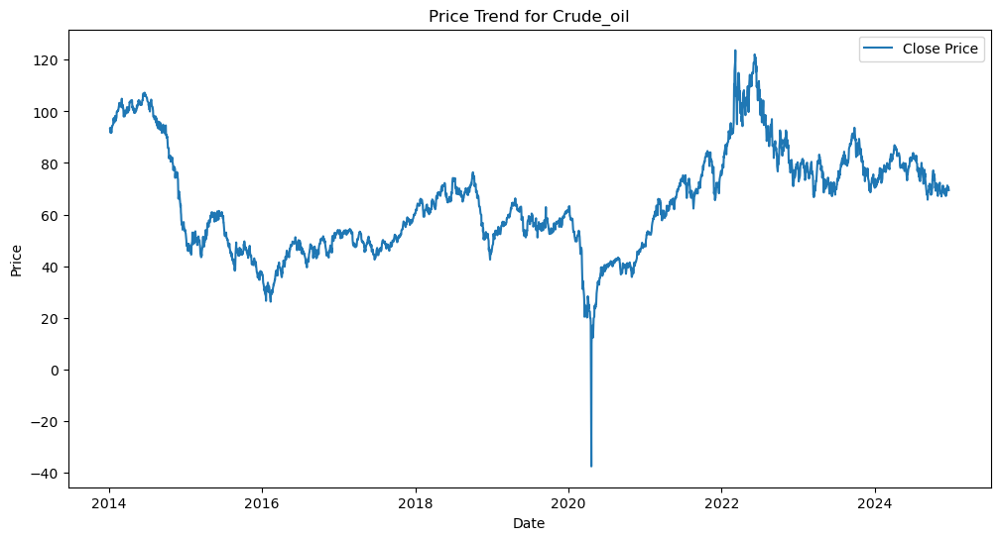

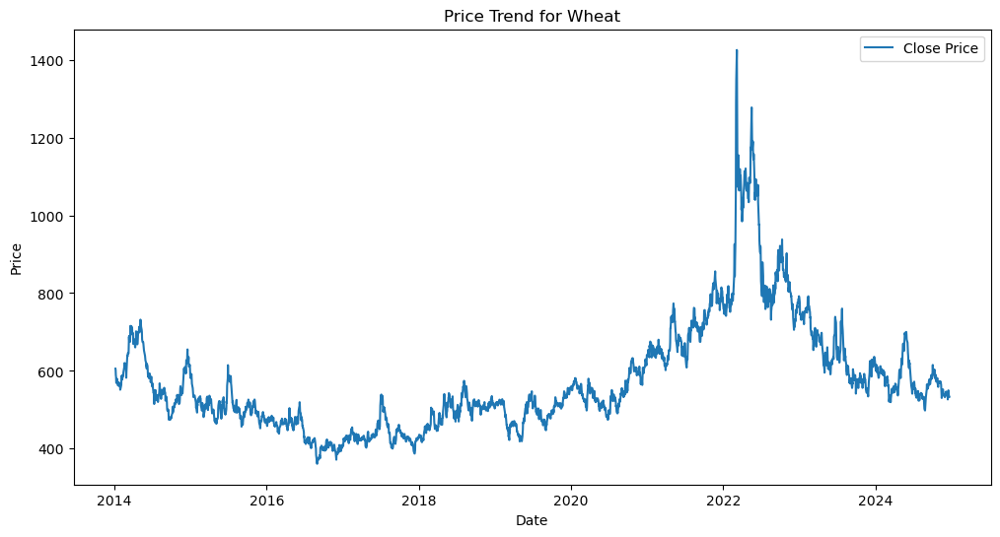

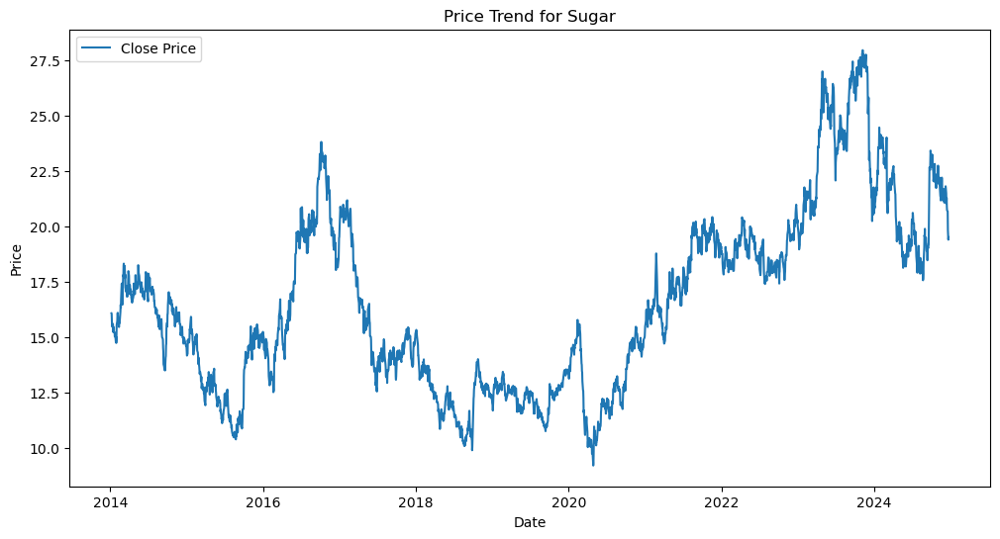

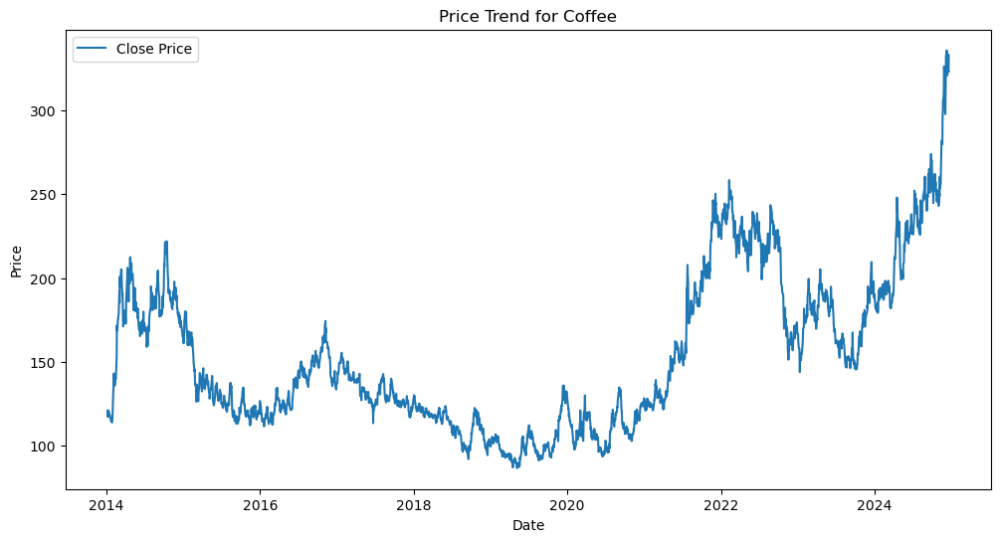

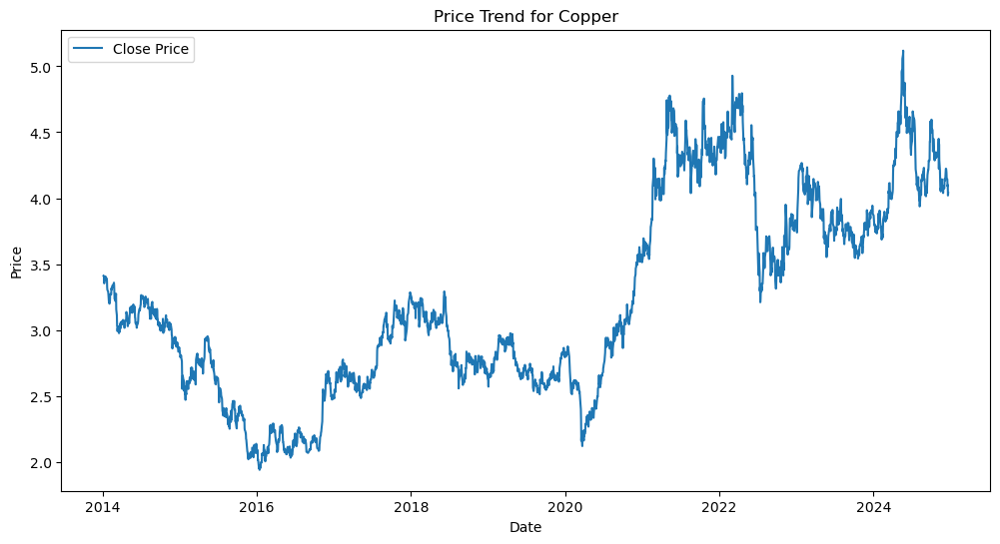

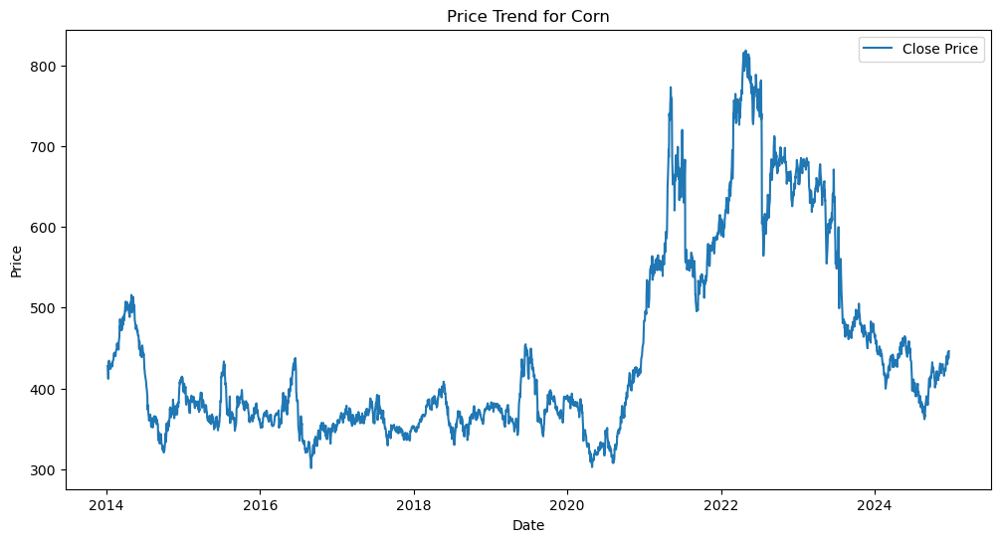

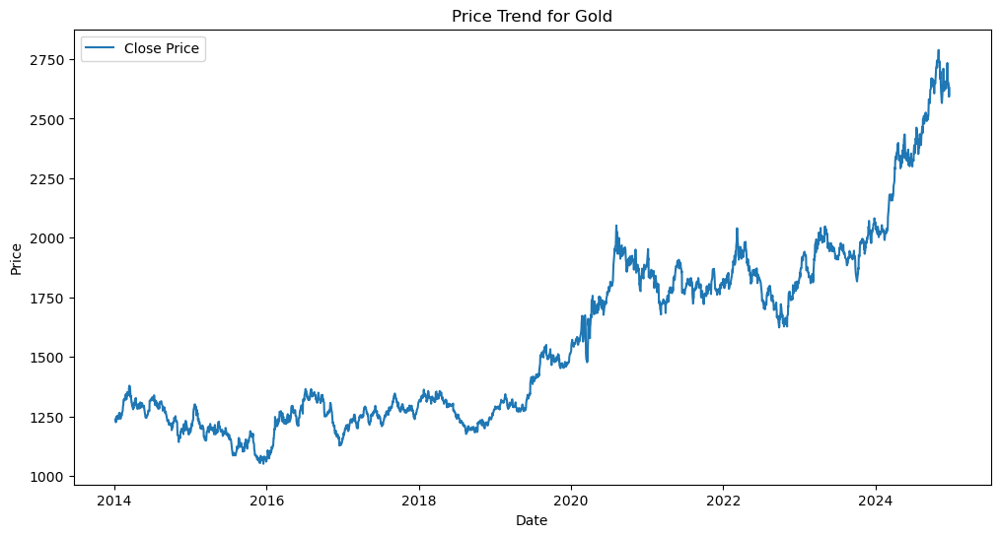

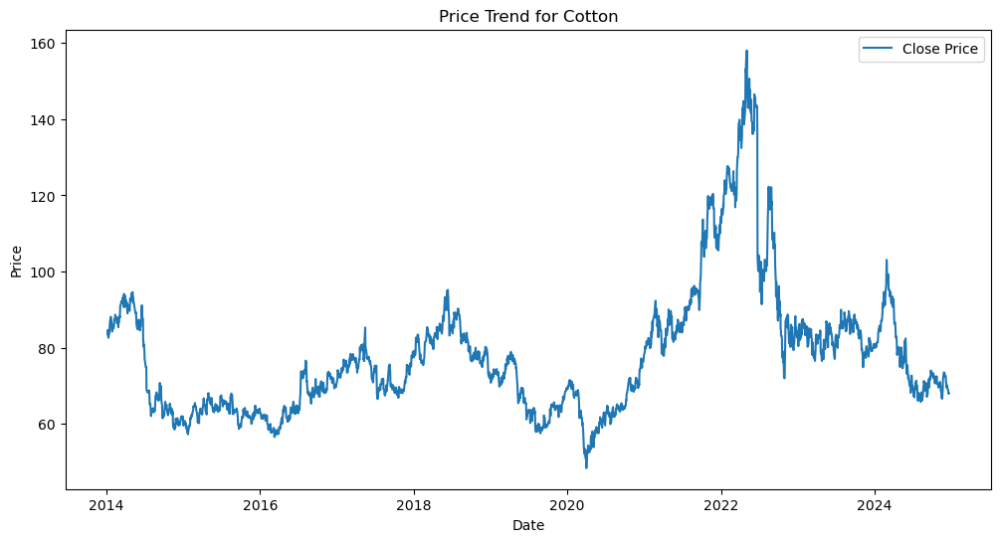

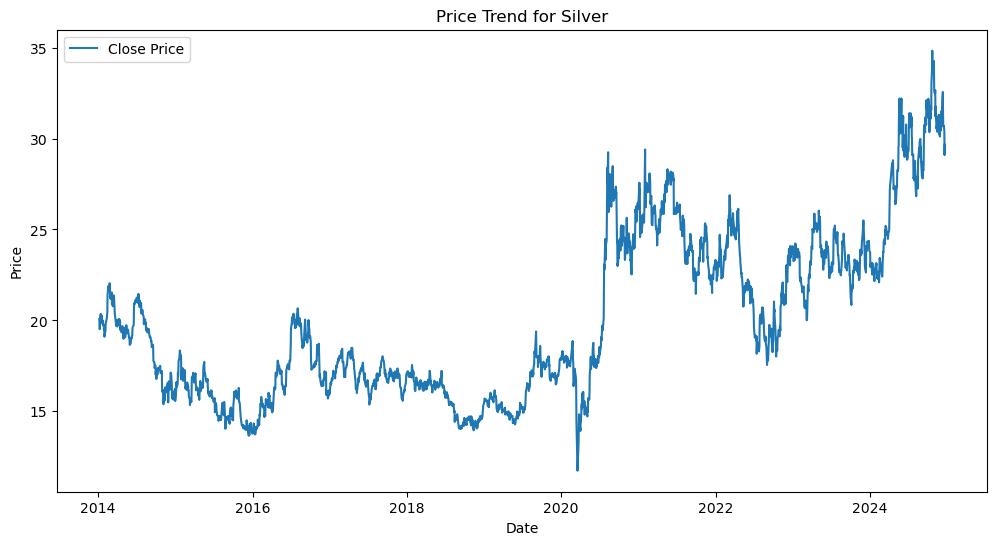

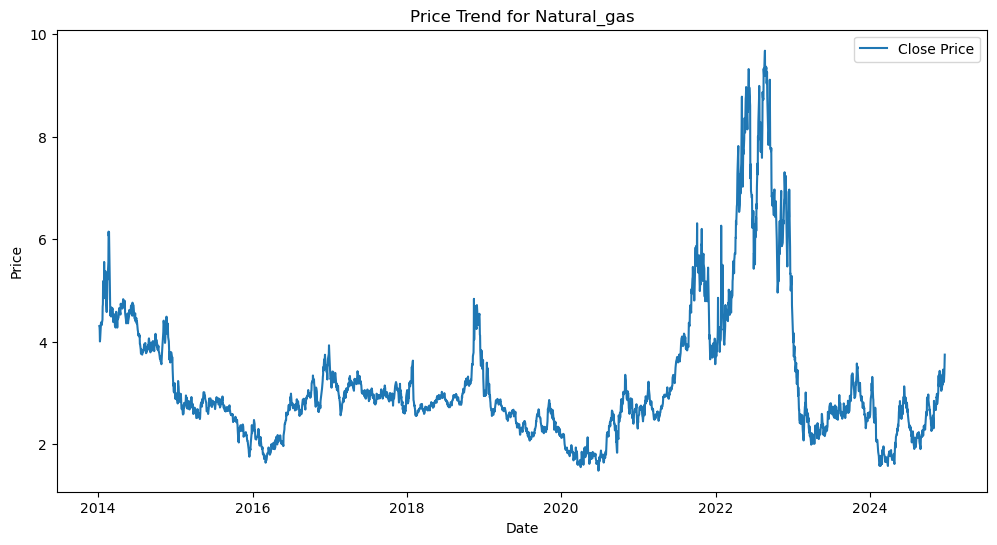

In [11]:
import matplotlib.pyplot as plt

def plot_time_series(file_path, commodity_name):
    df = pd.read_csv(file_path, parse_dates=['Date'])

    plt.figure(figsize=(12, 6))
    plt.plot(df['Date'], df['Close'], label='Close Price')
    plt.title(f"Price Trend for {commodity_name.capitalize()}")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot time series for each commodity
for file_name in commodity_files:
    commodity_name = file_name.replace("_cleaned.csv", "")
    file_path = os.path.join(data_dir, file_name)
    plot_time_series(file_path, commodity_name)


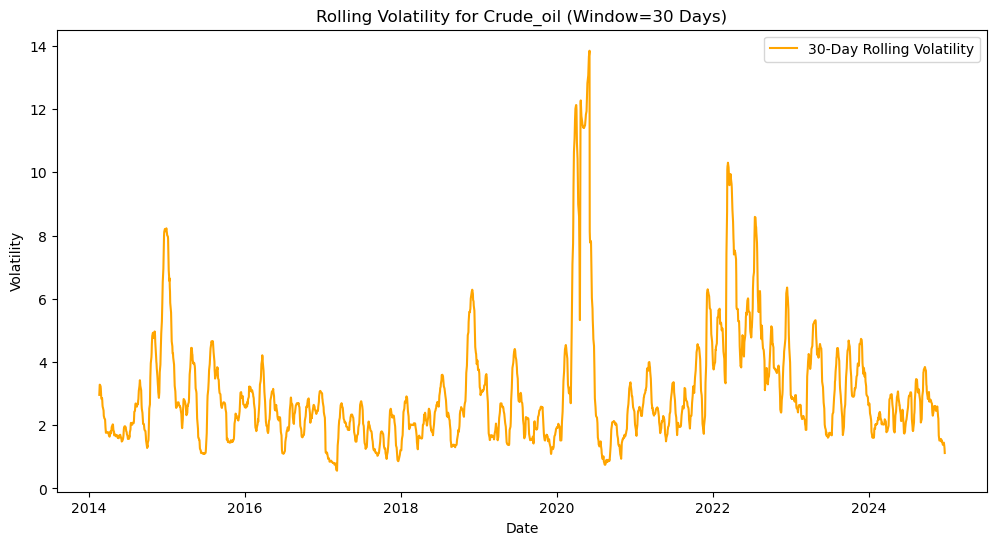

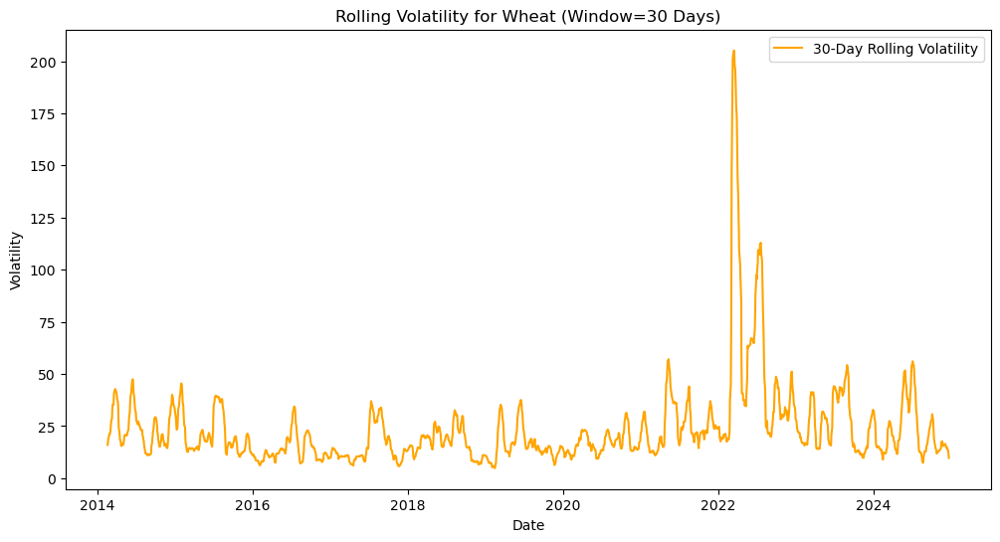

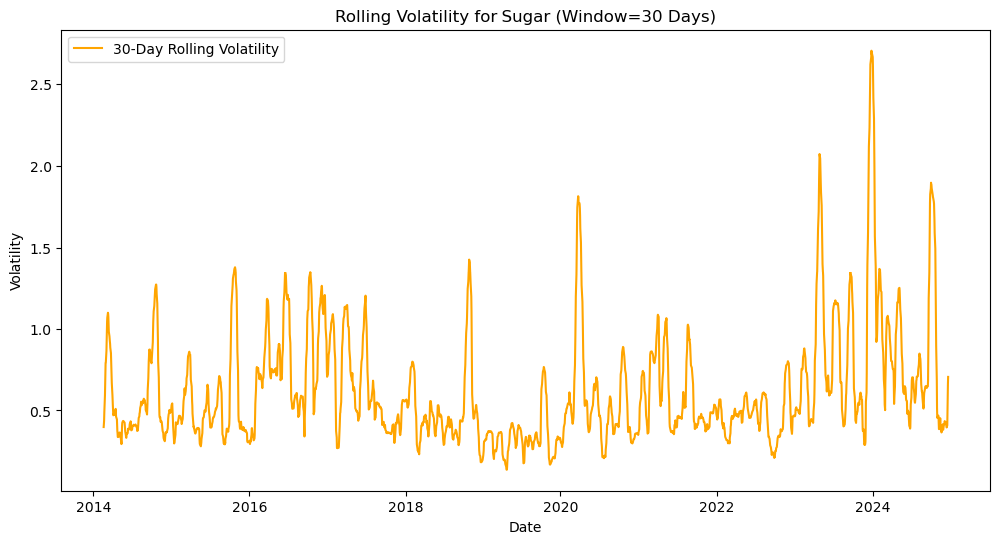

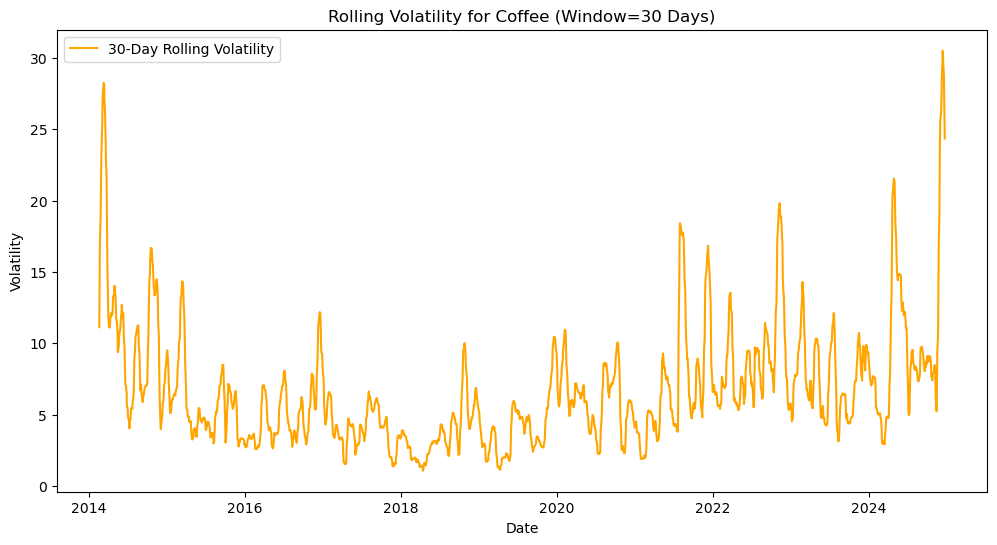

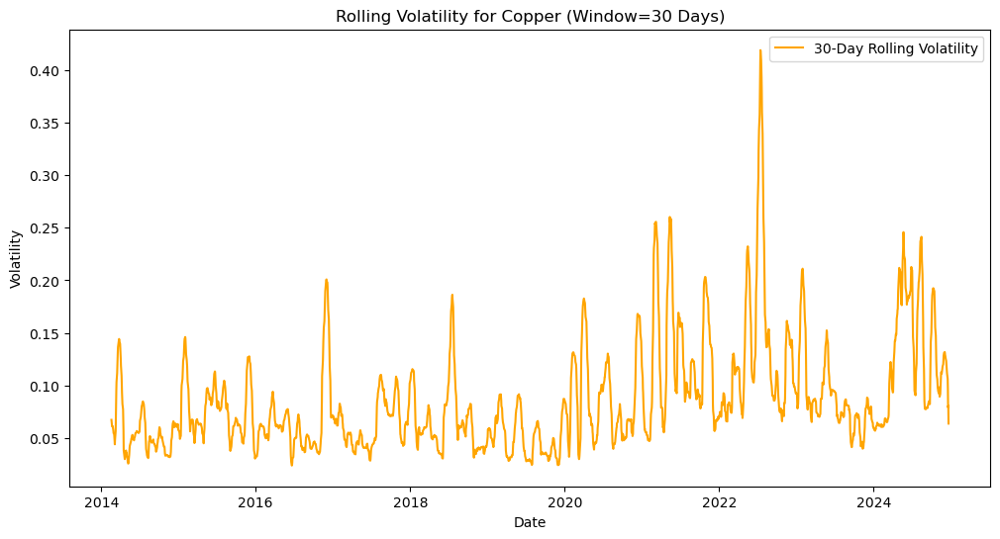

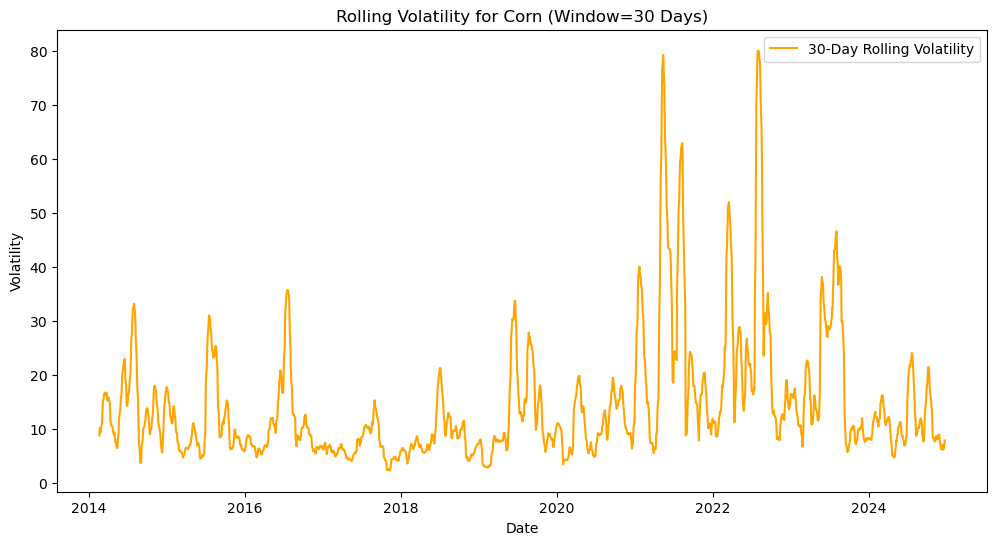

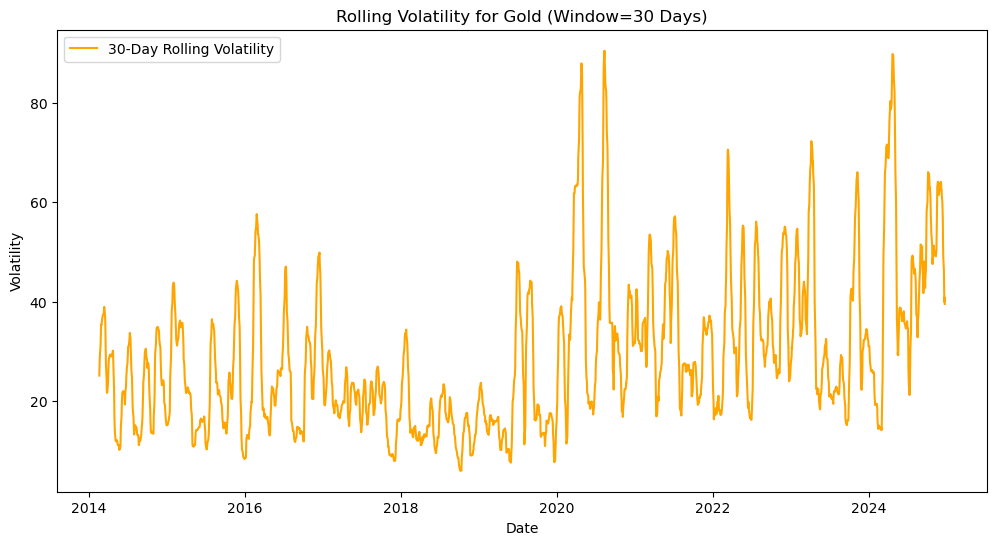

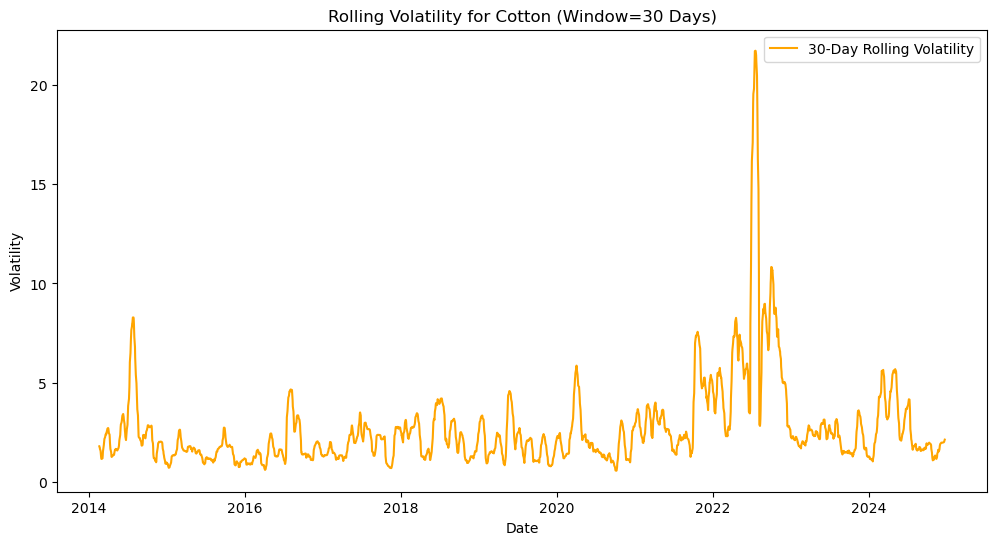

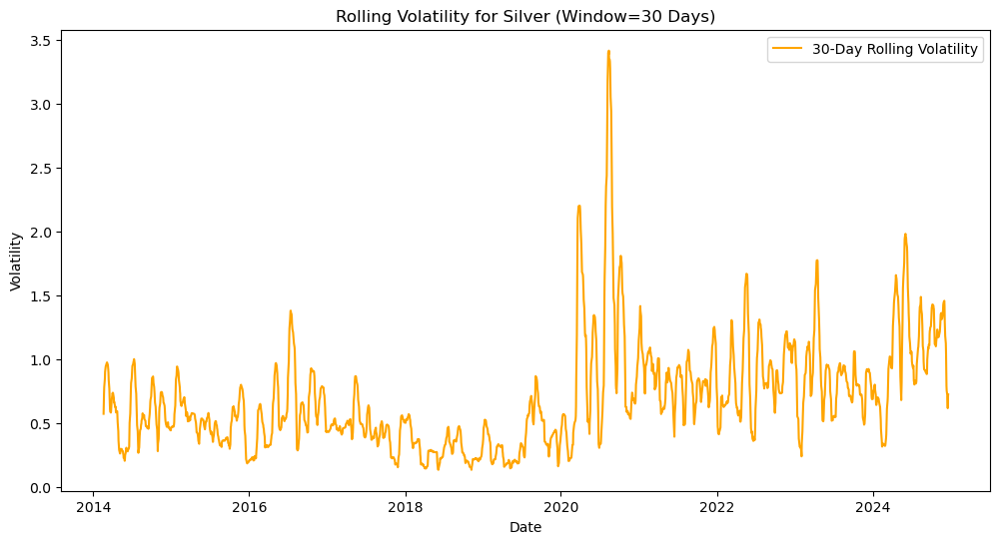

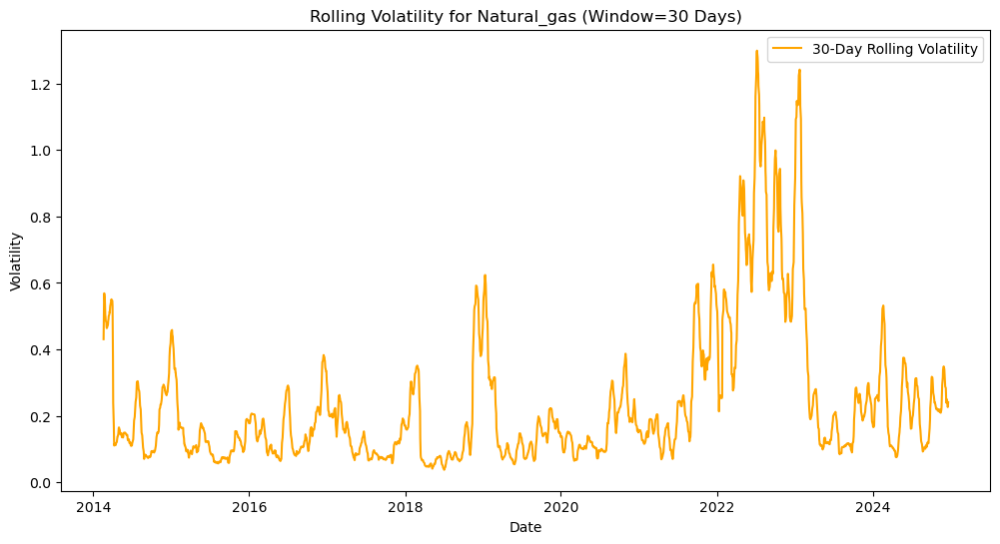

In [12]:
def plot_rolling_volatility(file_path, commodity_name, window=30):
    df = pd.read_csv(file_path, parse_dates=['Date'])

    # Calculate rolling 30-day standard deviation of the Close price
    df['Rolling Volatility'] = df['Close'].rolling(window=window).std()

    plt.figure(figsize=(12, 6))
    plt.plot(df['Date'], df['Rolling Volatility'], label=f'{window}-Day Rolling Volatility', color='orange')
    plt.title(f"Rolling Volatility for {commodity_name.capitalize()} (Window={window} Days)")
    plt.xlabel("Date")
    plt.ylabel("Volatility")
    plt.legend()
    plt.show()

# Plot rolling volatility for each commodity
for file_name in commodity_files:
    commodity_name = file_name.replace("_cleaned.csv", "")
    file_path = os.path.join(data_dir, file_name)
    plot_rolling_volatility(file_path, commodity_name)



Correlation Matrix of Commodity Prices:

             crude_oil     wheat     sugar    coffee    copper      corn  \
crude_oil     1.000000  0.649680  0.468182  0.637014  0.655594  0.614684   
wheat         0.649680  1.000000  0.356103  0.566109  0.691244  0.899439   
sugar         0.468182  0.356103  1.000000  0.653265  0.550752  0.489286   
coffee        0.637014  0.566109  0.653265  1.000000  0.700886  0.527534   
copper        0.655594  0.691244  0.550752  0.700886  1.000000  0.717373   
corn          0.614684  0.899439  0.489286  0.527534  0.717373  1.000000   
gold          0.325326  0.462304  0.561761  0.636897  0.777535  0.452243   
cotton        0.694653  0.787534  0.392260  0.509463  0.654602  0.755359   
silver        0.404360  0.460027  0.605417  0.656984  0.821798  0.484986   
natural_gas   0.633488  0.675288  0.199846  0.454089  0.345736  0.607530   

                 gold    cotton    silver  natural_gas  
crude_oil    0.325326  0.694653  0.404360     0.633488  
wheat  

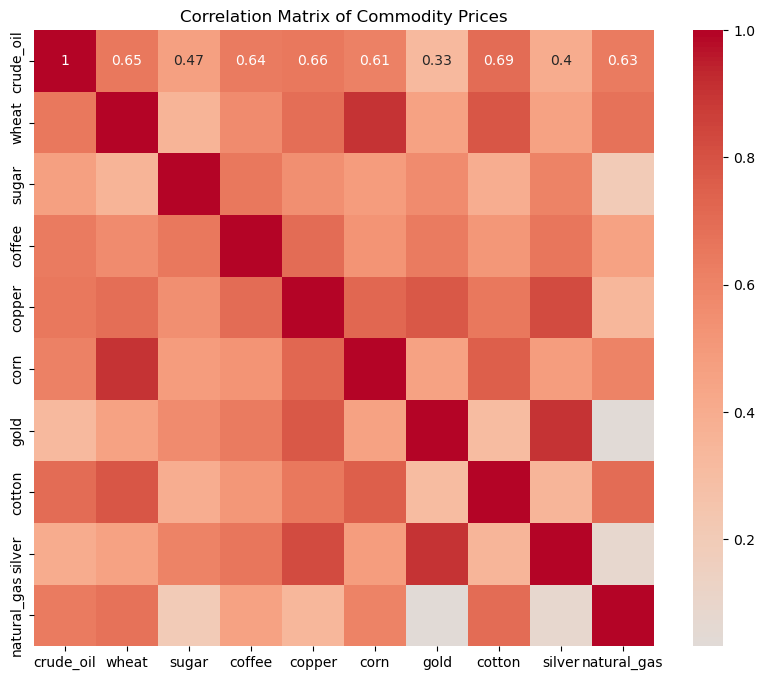

In [13]:
import pandas as pd

# Load all commodities into a single DataFrame with Date and Close columns
commodity_data = {}

for file_name in commodity_files:
    commodity_name = file_name.replace("_cleaned.csv", "")
    file_path = os.path.join(data_dir, file_name)
    df = pd.read_csv(file_path, parse_dates=['Date'])
    commodity_data[commodity_name] = df.set_index('Date')['Close']

# Combine all Close price series into a single DataFrame
combined_df = pd.DataFrame(commodity_data)

# Calculate and display the correlation matrix
correlation_matrix = combined_df.corr()
print("\nCorrelation Matrix of Commodity Prices:\n")
print(correlation_matrix)

# Plot the correlation matrix as a heatmap
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", center=0)
plt.title("Correlation Matrix of Commodity Prices")
plt.show()


# Sentiment Analysis

In [14]:
!pip install vaderSentiment



In [15]:
import requests
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import pandas as pd
import time
from datetime import datetime

# Initialize Sentiment Analyzer
analyzer = SentimentIntensityAnalyzer()

# Your News API key
api_key = '7afc72ab80ad4f2ba7dc0f4b13fd193d'  # Ensure you have a valid API key

# Commodities list
commodities = ["crude oil", "coffee", "natural gas", "gold", "wheat", "cotton", "corn", "sugar", "silver", "copper"]

# Sentiment thresholds
thresholds = {
    "positive": 0.1,    # Adjust these values to your preferences
    "negative": -0.1
}

# Function to fetch and analyze sentiment for each commodity
def fetch_and_analyze_sentiment(commodity):
    url = f'https://newsapi.org/v2/everything?q={commodity}&language=en&apiKey={api_key}'
    response = requests.get(url)
    articles = response.json().get('articles', [])

    # Print response to debug
    print(f"Fetching news for {commodity}...")
    print(f"API Response: {response.json()}")  # Print the full response for debugging

    # List to store sentiment data
    sentiment_data = []

    for article in articles:
        title = article['title']
        description = article['description'] or ""
        content = article['content'] or ""

        # Aggregate the text for sentiment analysis
        text = f"{title}. {description}. {content}"

        # Get sentiment score
        sentiment = analyzer.polarity_scores(text)
        compound_score = sentiment['compound']

        # Classify sentiment based on thresholds
        if compound_score >= thresholds['positive']:
            sentiment_label = "Positive"
        elif compound_score <= thresholds['negative']:
            sentiment_label = "Negative"
        else:
            sentiment_label = "Neutral"

        # Add data to list
        sentiment_data.append({
            'Commodity': commodity,
            'Title': title,
            'Description': description,
            'Content': content,
            'Published At': article['publishedAt'],
            'Sentiment Score': compound_score,
            'Sentiment Label': sentiment_label
        })

    return pd.DataFrame(sentiment_data)

# Gather and combine sentiment data for all commodities
def gather_commodity_sentiment(commodities):
    all_sentiment_data = pd.DataFrame()

    for commodity in commodities:
        sentiment_df = fetch_and_analyze_sentiment(commodity)
        all_sentiment_data = pd.concat([all_sentiment_data, sentiment_df], ignore_index=True)
        time.sleep(1)  # to avoid hitting rate limits

    # Debug print
    print("Combined Sentiment Data:")
    print(all_sentiment_data.head())  # Show the first few rows of combined sentiment data

    return all_sentiment_data

# Dynamically adjust sentiment for commodities
def adjust_sentiment_analysis(all_sentiment_data):
    analysis_results = []

    # Ensure 'Commodity' column exists
    if 'Commodity' not in all_sentiment_data.columns:
        raise KeyError("Column 'Commodity' not found in the sentiment data.")

    for commodity in commodities:
        df_commodity = all_sentiment_data[all_sentiment_data['Commodity'] == commodity]

        # Calculate positive, neutral, negative sentiment counts
        positive_count = df_commodity[df_commodity['Sentiment Label'] == "Positive"].shape[0]
        neutral_count = df_commodity[df_commodity['Sentiment Label'] == "Neutral"].shape[0]
        negative_count = df_commodity[df_commodity['Sentiment Label'] == "Negative"].shape[0]

        # Determine overall sentiment trend based on majority
        if positive_count > negative_count and positive_count > neutral_count:
            overall_sentiment = "Positive"
        elif negative_count > positive_count and negative_count > neutral_count:
            overall_sentiment = "Negative"
        else:
            overall_sentiment = "Neutral"

        # Calculate sentiment score averages and trends
        avg_sentiment_score = df_commodity['Sentiment Score'].mean()
        latest_timestamp = df_commodity['Published At'].max()

        analysis_results.append({
            'Commodity': commodity,
            'Overall Sentiment': overall_sentiment,
            'Average Sentiment Score': avg_sentiment_score,
            'Positive Count': positive_count,
            'Neutral Count': neutral_count,
            'Negative Count': negative_count,
            'Last Update': latest_timestamp
        })

    return pd.DataFrame(analysis_results)

# Run the analysis and adjust sentiment dynamically
all_sentiment_data = gather_commodity_sentiment(commodities)
analysis_results = adjust_sentiment_analysis(all_sentiment_data)

# Display the final analysis for each commodity
print("\nSentiment Analysis Results:")
print(analysis_results)

# Optionally, save results for further analysis
all_sentiment_data.to_csv("dynamic_commodity_sentiment_data.csv", index=False)
analysis_results.to_csv("commodity_sentiment_summary.csv", index=False)


Fetching news for crude oil...
API Response: {'status': 'ok', 'totalResults': 3078, 'articles': [{'source': {'id': 'wired', 'name': 'Wired'}, 'author': 'Genevieve Guenther', 'title': 'The Fossil Fuels Conversation Needs a Hard Reset', 'description': 'The term “reducing emissions” has outlived its usefulness, a crutch to soften the blow that’s being exploited by greenwashers. Now it’s time to get real.', 'url': 'https://www.wired.com/story/fossil-fuels-conversation-needs-a-hard-reset/', 'urlToImage': 'https://media.wired.com/photos/673f2ba1dee6c58c6e00a97b/191:100/w_1280,c_limit/WW25-Environment-GG-Takahashi-Ayumi.jpg', 'publishedAt': '2024-11-26T09:40:00Z', 'content': 'In 2025, we will see a fundamental transformation in the language of climate politics. Were going to hear a lot less about reducing emissions from scientists and policymakers and a lot more about pha… [+5275 chars]'}, {'source': {'id': 'usa-today', 'name': 'USA Today'}, 'author': 'Paul Davidson, USA TODAY', 'title': "Why

In [16]:
import requests
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import pandas as pd
import time
from datetime import datetime

# Initialize Sentiment Analyzer
analyzer = SentimentIntensityAnalyzer()

# Your News API key
api_key = '7afc72ab80ad4f2ba7dc0f4b13fd193d'

# Commodities list
commodities = ["crude oil", "coffee", "natural gas", "gold", "wheat", "cotton", "corn", "sugar", "silver", "copper"]

# Sentiment thresholds
thresholds = {
    "positive": 0.1,    # Adjust these values to your preferences
    "negative": -0.1
}

# Function to fetch and analyze sentiment for each commodity
def fetch_and_analyze_sentiment(commodity):
    url = f'https://newsapi.org/v2/everything?q={commodity}&language=en&apiKey={api_key}'
    response = requests.get(url)
    articles = response.json().get('articles', [])

    # List to store sentiment data
    sentiment_data = []

    for article in articles:
        title = article['title']
        description = article['description'] or ""
        content = article['content'] or ""

        # Aggregate the text for sentiment analysis
        text = f"{title}. {description}. {content}"

        # Get sentiment score
        sentiment = analyzer.polarity_scores(text)
        compound_score = sentiment['compound']

        # Classify sentiment based on thresholds
        if compound_score >= thresholds['positive']:
            sentiment_label = "Positive"
        elif compound_score <= thresholds['negative']:
            sentiment_label = "Negative"
        else:
            sentiment_label = "Neutral"

        # Add data to list
        sentiment_data.append({
            'Commodity': commodity,
            'Title': title,
            'Description': description,
            'Content': content,
            'Published At': article['publishedAt'],
            'Sentiment Score': compound_score,
            'Sentiment Label': sentiment_label
        })

    return pd.DataFrame(sentiment_data)

# Gather and combine sentiment data for all commodities
def gather_commodity_sentiment(commodities):
    all_sentiment_data = pd.DataFrame()

    for commodity in commodities:
        print(f"Fetching news for {commodity}...")
        sentiment_df = fetch_and_analyze_sentiment(commodity)
        all_sentiment_data = pd.concat([all_sentiment_data, sentiment_df], ignore_index=True)
        time.sleep(1)  # to avoid hitting rate limits

    return all_sentiment_data

# Dynamically adjust sentiment for commodities
def adjust_sentiment_analysis(all_sentiment_data):
    analysis_results = []

    for commodity in commodities:
        df_commodity = all_sentiment_data[all_sentiment_data['Commodity'] == commodity]

        # Calculate positive, neutral, negative sentiment counts
        positive_count = df_commodity[df_commodity['Sentiment Label'] == "Positive"].shape[0]
        neutral_count = df_commodity[df_commodity['Sentiment Label'] == "Neutral"].shape[0]
        negative_count = df_commodity[df_commodity['Sentiment Label'] == "Negative"].shape[0]

        # Determine overall sentiment trend based on majority
        if positive_count > negative_count and positive_count > neutral_count:
            overall_sentiment = "Positive"
        elif negative_count > positive_count and negative_count > neutral_count:
            overall_sentiment = "Negative"
        else:
            overall_sentiment = "Neutral"

        # Calculate sentiment score averages and trends
        avg_sentiment_score = df_commodity['Sentiment Score'].mean()
        latest_timestamp = df_commodity['Published At'].max()

        analysis_results.append({
            'Commodity': commodity,
            'Overall Sentiment': overall_sentiment,
            'Average Sentiment Score': avg_sentiment_score,
            'Positive Count': positive_count,
            'Neutral Count': neutral_count,
            'Negative Count': negative_count,
            'Last Update': latest_timestamp
        })

    return pd.DataFrame(analysis_results)

# Run the analysis and adjust sentiment dynamically
all_sentiment_data = gather_commodity_sentiment(commodities)
analysis_results = adjust_sentiment_analysis(all_sentiment_data)

# Display the final analysis for each commodity
print("\nSentiment Analysis Results:")
print(analysis_results)

# Optionally, save results for further analysis
all_sentiment_data.to_csv("dynamic_commodity_sentiment_data.csv", index=False)
analysis_results.to_csv("commodity_sentiment_summary.csv", index=False)


Fetching news for crude oil...
Fetching news for coffee...
Fetching news for natural gas...
Fetching news for gold...
Fetching news for wheat...
Fetching news for cotton...
Fetching news for corn...
Fetching news for sugar...
Fetching news for silver...
Fetching news for copper...

Sentiment Analysis Results:
     Commodity Overall Sentiment  Average Sentiment Score  Positive Count  \
0    crude oil          Negative                -0.186586              31   
1       coffee          Positive                 0.485506              73   
2  natural gas          Positive                 0.337006              66   
3         gold          Positive                 0.356538              64   
4        wheat          Positive                 0.347786              68   
5       cotton          Positive                 0.584193              87   
6         corn          Positive                 0.393935              68   
7        sugar          Positive                 0.524665              77

In [17]:
import os

# Define the directory to store the cleaned sentiment data
sentiment_data_dir = "sentiment_data"
os.makedirs(sentiment_data_dir, exist_ok=True)

# Define file paths for storing sentiment data
cleaned_sentiment_file_path = os.path.join(sentiment_data_dir, "cleaned_sentiment_data.csv")
summary_sentiment_file_path = os.path.join(sentiment_data_dir, "commodity_sentiment_summary.csv")

# Clean and format the analysis results DataFrame
def clean_sentiment_data(analysis_results):
    # Drop any duplicates if present
    analysis_results = analysis_results.drop_duplicates()

    # Ensure no missing values in critical columns
    analysis_results = analysis_results.dropna(subset=["Commodity", "Overall Sentiment", "Average Sentiment Score"])

    # Sort by Commodity for easy reference
    analysis_results = analysis_results.sort_values(by="Commodity").reset_index(drop=True)

    # Save the cleaned sentiment data
    analysis_results.to_csv(cleaned_sentiment_file_path, index=False)
    print(f"Cleaned sentiment data saved to {cleaned_sentiment_file_path}")

# Run the cleaning function
clean_sentiment_data(analysis_results)

# Optionally, save all raw sentiment data if required for comparison or auditing
all_sentiment_data.to_csv(summary_sentiment_file_path, index=False)
print(f"Complete sentiment summary saved to {summary_sentiment_file_path}")


Cleaned sentiment data saved to sentiment_data/cleaned_sentiment_data.csv
Complete sentiment summary saved to sentiment_data/commodity_sentiment_summary.csv


# Feature Engineering for using enhance predictive analysis and improve trading strategy signals


Daily Returns

In [18]:
import pandas as pd
import os

# Directory containing the cleaned data files
data_dir = "commodity_data"
commodity_files = [f for f in os.listdir(data_dir) if f.endswith("_cleaned.csv")]

def add_daily_returns(df):
    df['Daily_Return'] = df['Close'].pct_change()
    return df


Moving Averages (10-day, 30-day 50-day)

In [19]:
def add_moving_averages(df):
    df['MA_10'] = df['Close'].rolling(window=10).mean()
    df['MA_30'] = df['Close'].rolling(window=30).mean()
    df['MA_50'] = df['Close'].rolling(window=50).mean()
    return df


Exponential Moving Average (EMA)

In [20]:
def add_ema(df, span=10):
    df['EMA_10'] = df['Close'].ewm(span=span, adjust=False).mean()
    return df


Bollinger Bands

In [21]:
def add_bollinger_bands(df, window=20):
    # Middle Band (20-day Moving Average)
    df['BB_Middle'] = df['Close'].rolling(window=window).mean()
    # Upper Band and Lower Band with standard deviation multiplier
    df['BB_Upper'] = df['BB_Middle'] + 2 * df['Close'].rolling(window=window).std()
    df['BB_Lower'] = df['BB_Middle'] - 2 * df['Close'].rolling(window=window).std()
    return df


Relative Strength Index (RSI)

In [22]:
def add_rsi(df, window=14):
    delta = df['Close'].diff(1)
    gain = (delta.where(delta > 0, 0)).rolling(window=window).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=window).mean()
    rs = gain / loss
    df['RSI'] = 100 - (100 / (1 + rs))
    return df


Moving Average Convergence Divergence (MACD)

In [23]:
def add_macd(df):
    exp1 = df['Close'].ewm(span=12, adjust=False).mean()
    exp2 = df['Close'].ewm(span=26, adjust=False).mean()
    df['MACD'] = exp1 - exp2
    df['Signal_Line'] = df['MACD'].ewm(span=9, adjust=False).mean()
    return df


Applying the Features to Each Commodity

In [24]:
def engineer_features(file_path, commodity_name):
    print(f"Engineering features for {commodity_name}...")

    # Load the cleaned CSV file
    df = pd.read_csv(file_path, parse_dates=['Date'])

    # Apply feature engineering functions
    df = add_daily_returns(df)
    df = add_moving_averages(df)
    df = add_ema(df)
    df = add_bollinger_bands(df)
    df = add_rsi(df)
    df = add_macd(df)

    # Save the enhanced data back to the same file with a new suffix
    feature_file_path = os.path.join(data_dir, f"{commodity_name}_features.csv")
    df.to_csv(feature_file_path, index=False)
    print(f"Features added and data saved for {commodity_name}.")

# Process each file in the directory
for file_name in commodity_files:
    commodity_name = file_name.replace("_cleaned.csv", "")  # Extract commodity name from file name
    file_path = os.path.join(data_dir, file_name)
    engineer_features(file_path, commodity_name)

print("Feature engineering complete for all commodities.")


Engineering features for crude_oil...
Features added and data saved for crude_oil.
Engineering features for wheat...
Features added and data saved for wheat.
Engineering features for sugar...
Features added and data saved for sugar.
Engineering features for coffee...
Features added and data saved for coffee.
Engineering features for copper...
Features added and data saved for copper.
Engineering features for corn...
Features added and data saved for corn.
Engineering features for gold...
Features added and data saved for gold.
Engineering features for cotton...
Features added and data saved for cotton.
Engineering features for silver...
Features added and data saved for silver.
Engineering features for natural_gas...
Features added and data saved for natural_gas.
Feature engineering complete for all commodities.


Visualising Features

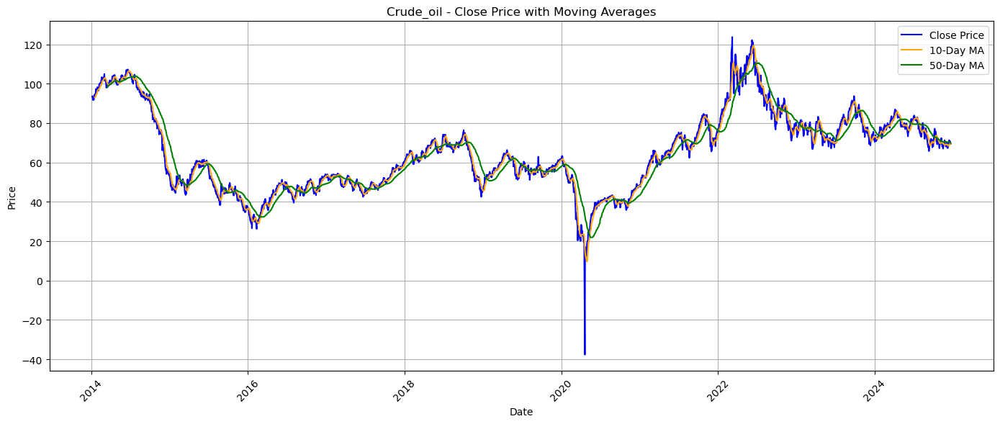

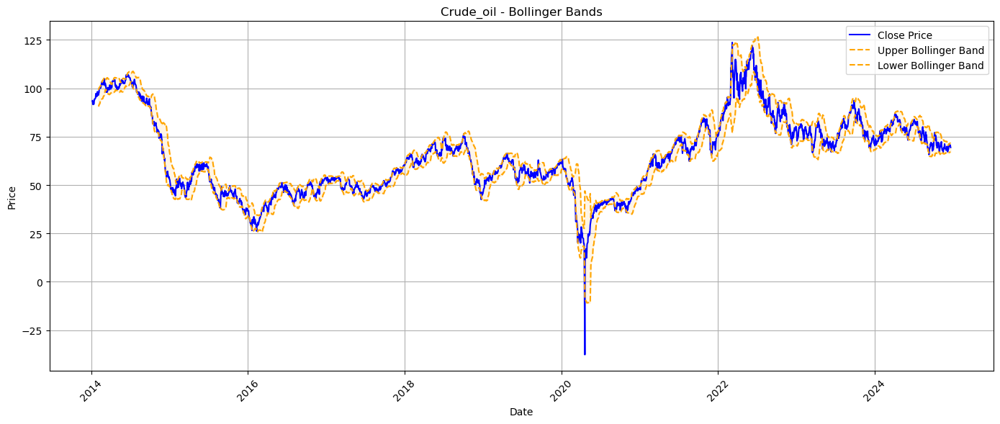

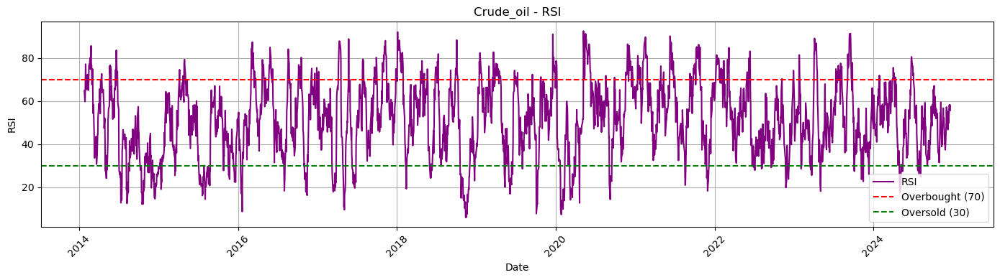

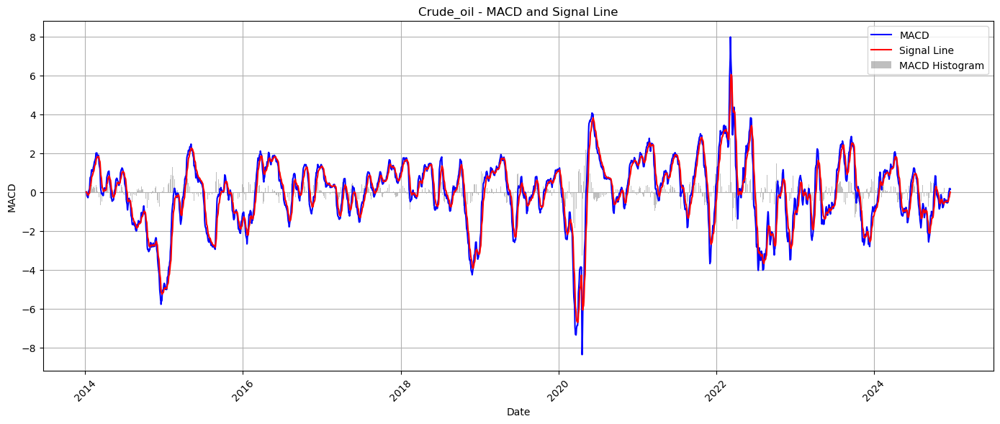

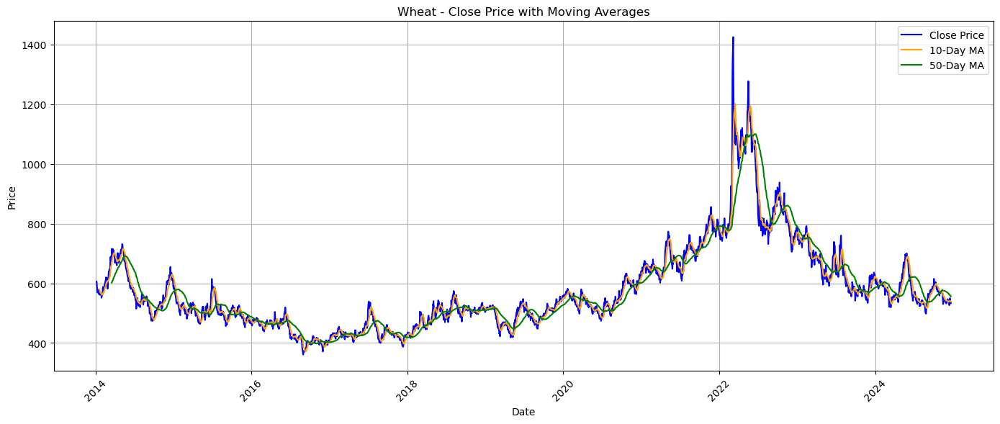

...

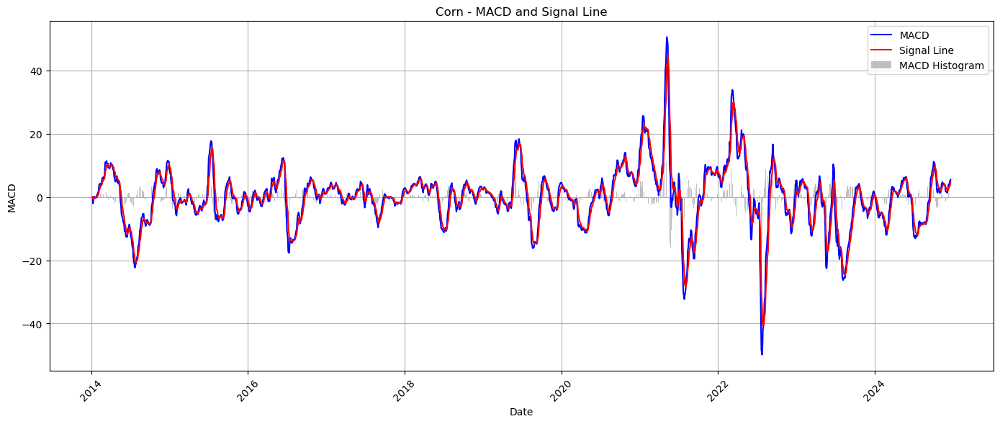

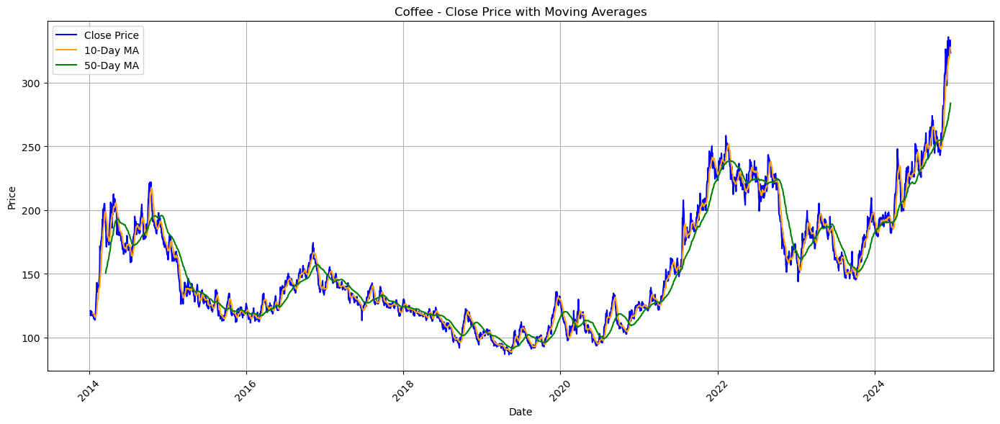

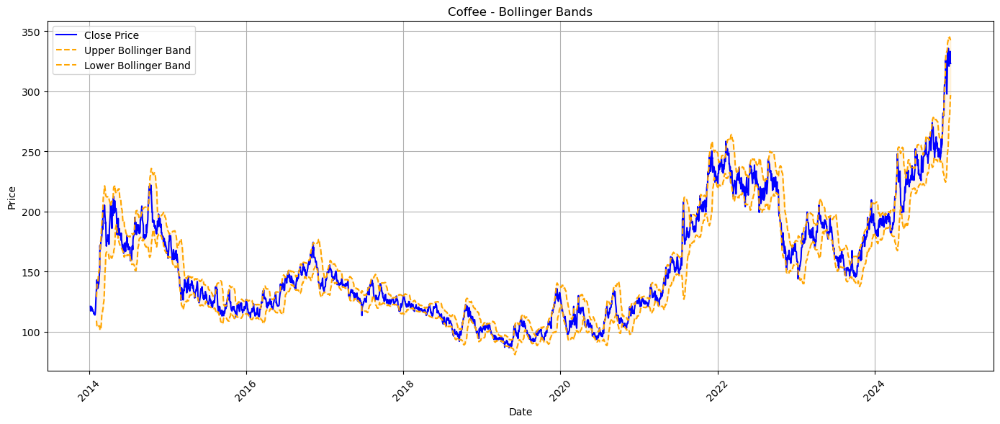

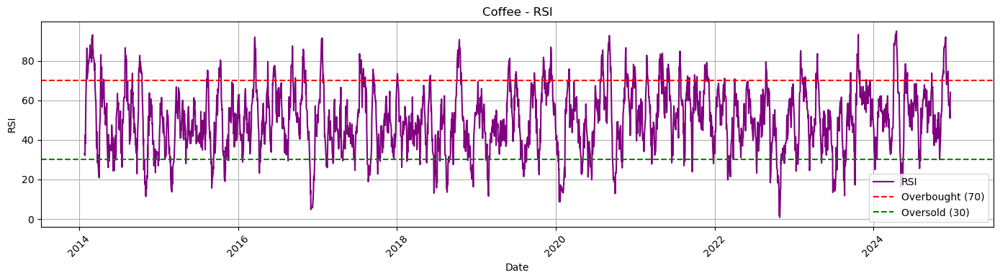

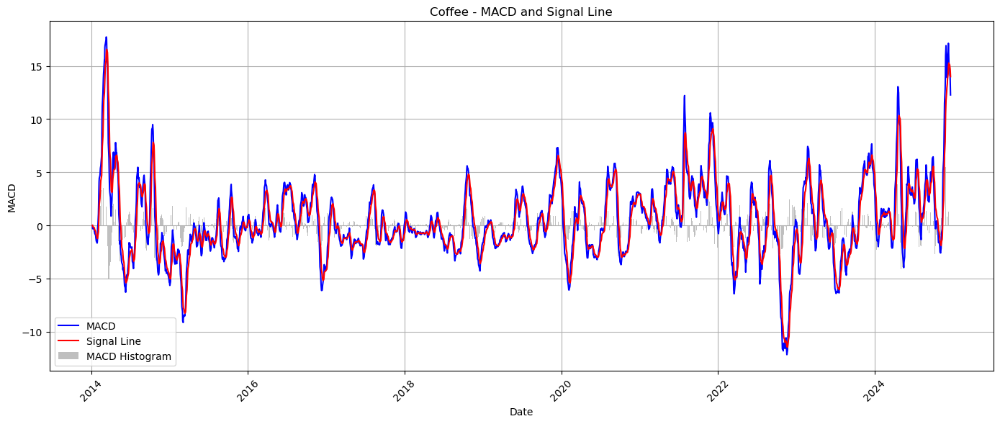

Feature plots generated for all commodities.


In [25]:
import pandas as pd
import os
import matplotlib.pyplot as plt

# Directory containing the feature-enhanced data files
data_dir = "commodity_data"
commodity_files = [f for f in os.listdir(data_dir) if f.endswith("_features.csv")]

def plot_features(file_path, commodity_name):
    # Load the data
    df = pd.read_csv(file_path, parse_dates=['Date'])

    # Plot Close Price with Moving Averages
    plt.figure(figsize=(14, 6))
    plt.plot(df['Date'], df['Close'], label='Close Price', color='blue')
    plt.plot(df['Date'], df['MA_10'], label='10-Day MA', color='orange')
    plt.plot(df['Date'], df['MA_50'], label='50-Day MA', color='green')
    plt.title(f"{commodity_name.capitalize()} - Close Price with Moving Averages")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.grid()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    # Plot Bollinger Bands
    plt.figure(figsize=(14, 6))
    plt.plot(df['Date'], df['Close'], label='Close Price', color='blue')
    plt.plot(df['Date'], df['BB_Upper'], label='Upper Bollinger Band', linestyle='--', color='orange')
    plt.plot(df['Date'], df['BB_Lower'], label='Lower Bollinger Band', linestyle='--', color='orange')
    plt.fill_between(df['Date'], df['BB_Lower'], df['BB_Upper'], color='orange', alpha=0.1)
    plt.title(f"{commodity_name.capitalize()} - Bollinger Bands")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.grid()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    # Plot RSI
    plt.figure(figsize=(14, 4))
    plt.plot(df['Date'], df['RSI'], label='RSI', color='purple')
    plt.axhline(70, linestyle='--', color='red', label='Overbought (70)')
    plt.axhline(30, linestyle='--', color='green', label='Oversold (30)')
    plt.title(f"{commodity_name.capitalize()} - RSI")
    plt.xlabel("Date")
    plt.ylabel("RSI")
    plt.legend()
    plt.grid()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    # Plot MACD and Signal Line
    plt.figure(figsize=(14, 6))
    plt.plot(df['Date'], df['MACD'], label='MACD', color='blue')
    plt.plot(df['Date'], df['Signal_Line'], label='Signal Line', color='red')
    plt.bar(df['Date'], df['MACD'] - df['Signal_Line'], label='MACD Histogram', color='gray', alpha=0.5)
    plt.title(f"{commodity_name.capitalize()} - MACD and Signal Line")
    plt.xlabel("Date")
    plt.ylabel("MACD")
    plt.legend()
    plt.grid()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Loop through each feature-enhanced file and visualize features
for file_name in commodity_files:
    commodity_name = file_name.replace("_features.csv", "")  # Extract commodity name from file name
    file_path = os.path.join(data_dir, file_name)
    plot_features(file_path, commodity_name)

print("Feature plots generated for all commodities.")


# Backtesting Strategies and finding the best strategy for each commodity

In [26]:
import pandas as pd

# Momentum Strategy using EMA_10
def momentum_strategy(df, window=10):
    df['Momentum'] = df['Close'].diff(window)
    df['Position'] = 0
    df.loc[(df['Momentum'] > 0) & (df['Close'] > df['EMA_10']), 'Position'] = 1
    df.loc[(df['Momentum'] < 0) & (df['Close'] < df['EMA_10']), 'Position'] = -1
    df['Strategy_Return'] = df['Position'].shift(1) * df['Close'].pct_change()
    df['Cumulative_Return'] = (1 + df['Strategy_Return']).cumprod()
    return df



In [27]:
import pandas as pd

# Range Trading Strategy using Bollinger Bands
def range_trading_strategy(df, support_level=None, resistance_level=None):
    if support_level is None:
        support_level = df['BB_Lower'].mean()
    if resistance_level is None:
        resistance_level = df['BB_Upper'].mean()

    df['Position'] = 0
    df.loc[df['Close'] <= support_level, 'Position'] = 1  # Buy near lower Bollinger Band
    df.loc[df['Close'] >= resistance_level, 'Position'] = -1  # Sell near upper Bollinger Band
    df['Strategy_Return'] = df['Position'].shift(1) * df['Close'].pct_change()
    df['Cumulative_Return'] = (1 + df['Strategy_Return']).cumprod()
    return df

In [28]:
import pandas as pd

# Breakout Strategy using Moving Average
def breakout_strategy(df, breakout_window=20):
    df['Highest_High'] = df['Close'].rolling(window=breakout_window).max()
    df['Lowest_Low'] = df['Close'].rolling(window=breakout_window).min()
    df['Position'] = 0
    df.loc[(df['Close'] > df['Highest_High'].shift(1)) & (df['Close'] > df['MA_10']), 'Position'] = 1
    df.loc[(df['Close'] < df['Lowest_Low'].shift(1)) & (df['Close'] < df['MA_10']), 'Position'] = -1
    df['Strategy_Return'] = df['Position'].shift(1) * df['Close'].pct_change()
    df['Cumulative_Return'] = (1 + df['Strategy_Return']).cumprod()
    return df


In [29]:
import pandas as pd

# Mean Reversion Strategy using RSI
def mean_reversion_strategy(df, window=20, threshold=0.05):
    df['Moving_Avg'] = df['Close'].rolling(window=window).mean()
    df['Deviation'] = (df['Close'] - df['Moving_Avg']) / df['Moving_Avg']
    df['Position'] = 0
    df.loc[(df['Deviation'] < -threshold) & (df['RSI'] < 30), 'Position'] = 1  # Buy below threshold and RSI < 30
    df.loc[(df['Deviation'] > threshold) & (df['RSI'] > 70), 'Position'] = -1  # Sell above threshold and RSI > 70
    df['Strategy_Return'] = df['Position'].shift(1) * df['Close'].pct_change()
    df['Cumulative_Return'] = (1 + df['Strategy_Return']).cumprod()
    return df

In [30]:
import pandas as pd

# News-Based Trading Strategy using RSI
def news_based_trading_strategy(df, sentiment_data):
    df['Position'] = 0
    df.loc[(sentiment_data['Sentiment'] == 'Positive') & (df['RSI'] < 70), 'Position'] = 1
    df.loc[(sentiment_data['Sentiment'] == 'Negative') & (df['RSI'] > 30), 'Position'] = -1
    df['Strategy_Return'] = df['Position'].shift(1) * df['Close'].pct_change()
    df['Cumulative_Return'] = (1 + df['Strategy_Return']).cumprod()
    return df


In [31]:
import pandas as pd

# Seasonal Strategy using EMA_10
def seasonal_trading_strategy(df, buy_months=[1, 2, 11, 12], sell_months=[5, 6, 7, 8]):
    df['Position'] = 0
    df['Month'] = df['Date'].dt.month
    df.loc[(df['Month'].isin(buy_months)) & (df['Close'] > df['EMA_10']), 'Position'] = 1
    df.loc[(df['Month'].isin(sell_months)) & (df['Close'] < df['EMA_10']), 'Position'] = -1
    df['Strategy_Return'] = df['Position'].shift(1) * df['Close'].pct_change()
    df['Cumulative_Return'] = (1 + df['Strategy_Return']).cumprod()
    return df


In [32]:
# Backtest all strategies
def backtest_all_strategies(df):
    strategies = {
        "Momentum Strategy": momentum_strategy(df.copy()),
        "Range Trading Strategy": range_trading_strategy(df.copy()),
        "Breakout Strategy": breakout_strategy(df.copy()),
        "Mean Reversion Strategy": mean_reversion_strategy(df.copy()),
        "Seasonal Strategy": seasonal_trading_strategy(df.copy()),
    }
    results = {name: (strategy['Cumulative_Return'].iloc[-1] - 1) * 100 for name, strategy in strategies.items()}
    return results

# Backtest, calculate CAGR, and identify best strategies
all_results = []
for file_name in commodity_files:
    file_path = os.path.join(data_dir, file_name)
    df = pd.read_csv(file_path)
    if 'Date' in df.columns:
        df['Date'] = pd.to_datetime(df['Date'])
    results = backtest_all_strategies(df)
    for strategy, return_pct in results.items():
        all_results.append({
            'Commodity': file_name.replace("_features.csv", ""),
            'Strategy': strategy,
            'Cumulative Return (%)': return_pct
        })

# Convert results to DataFrame
results_df = pd.DataFrame(all_results)
results_df['Cumulative_Return_Factor'] = (results_df['Cumulative Return (%)'] / 100) + 1
data_period_years = 10
results_df['CAGR (%)'] = ((results_df['Cumulative_Return_Factor'] ** (1 / data_period_years)) - 1) * 100

# Group results by Commodity and Strategy
final_cagr_df = results_df.groupby(['Commodity', 'Strategy'], as_index=False)['CAGR (%)'].mean()
best_strategies = final_cagr_df.loc[final_cagr_df.groupby("Commodity")['CAGR (%)'].idxmax()]

# Display results
print("\n--- Cumulative Returns for Each Strategy by Commodity ---")
print(results_df[['Commodity', 'Strategy', 'Cumulative Return (%)']])
print("\n--- CAGR for Each Strategy by Commodity ---")
print(final_cagr_df)
print("\n--- Best Trading Strategy for Each Commodity Based on CAGR ---")
print(best_strategies)

# Save results to CSV files
results_df.to_csv("commodity_strategy_cumulative_returns.csv", index=False)
best_strategies.to_csv("best_trading_strategy_per_commodity.csv", index=False)


--- Cumulative Returns for Each Strategy by Commodity ---
      Commodity                 Strategy  Cumulative Return (%)
0     crude_oil        Momentum Strategy             335.720736
1     crude_oil   Range Trading Strategy             301.255264
2     crude_oil        Breakout Strategy             533.896677
3     crude_oil  Mean Reversion Strategy            -109.695182
4     crude_oil        Seasonal Strategy              31.300129
5         wheat        Momentum Strategy             -38.347347
6         wheat   Range Trading Strategy             191.718807
7         wheat        Breakout Strategy              11.202650
8         wheat  Mean Reversion Strategy             -24.166482
9         wheat        Seasonal Strategy              49.663697
10       cotton        Momentum Strategy             -35.085222
11       cotton   Range Trading Strategy             145.272755
12       cotton        Breakout Strategy             -19.627865
13       cotton  Mean Reversion Strategy     

# XGBoost

In [33]:
import pandas as pd
import os
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error
from xgboost import XGBRegressor
import numpy as np


In [34]:
'''
def train_xgboost_model(df, commodity_name):
    # Ensure necessary features exist
    if 'Future_Close' not in df.columns:
        df['Future_Close'] = df['Close'].shift(-1)  # Target is next day's Close price

    # Drop rows with missing values
    df = df.dropna()

    # Define features (X) and target (y)
    X = df.drop(columns=['Future_Close', 'Date'], errors='ignore')
    y = df['Future_Close']

    # Train-test split (80/20 without shuffle for time series)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

    # Initialize and train XGBoost model
    model = XGBRegressor(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)

    # Predictions
    y_pred = model.predict(X_test)

    # Evaluate
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))

    # Print results
    print(f"{commodity_name}: MAE = {mae:.2f}, RMSE = {rmse:.2f}")

    # Save predictions
    predictions_df = X_test.copy()
    predictions_df['Actual_Close'] = y_test
    predictions_df['Predicted_Close'] = y_pred
    predictions_df.to_csv(f"xgboost_predictions_{commodity_name}.csv", index=False)

    return {"Commodity": commodity_name, "MAE": mae, "RMSE": rmse}
'''

'\ndef train_xgboost_model(df, commodity_name):\n    # Ensure necessary features exist\n    if \'Future_Close\' not in df.columns:\n        df[\'Future_Close\'] = df[\'Close\'].shift(-1)  # Target is next day\'s Close price\n\n    # Drop rows with missing values\n    df = df.dropna()\n\n    # Define features (X) and target (y)\n    X = df.drop(columns=[\'Future_Close\', \'Date\'], errors=\'ignore\')\n    y = df[\'Future_Close\']\n\n    # Train-test split (80/20 without shuffle for time series)\n    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)\n\n    # Initialize and train XGBoost model\n    model = XGBRegressor(n_estimators=100, random_state=42)\n    model.fit(X_train, y_train)\n\n    # Predictions\n    y_pred = model.predict(X_test)\n\n    # Evaluate\n    mae = mean_absolute_error(y_test, y_pred)\n    rmse = np.sqrt(mean_squared_error(y_test, y_pred))\n\n    # Print results\n    print(f"{commodity_name}: MAE = {mae:.2f}, RMSE = {rmse:.2f}")\n

In [35]:
def train_xgboost_model(df, commodity_name):
    """
    Train XGBoost model on the first 90% of data.
    Use 70% for training and 20% for testing.
    Leave the last 10% completely hidden for backtesting.
    """
    # Ensure necessary features exist
    if 'Future_Close' not in df.columns:
        df['Future_Close'] = df['Close'].shift(-1)  # Target is next day's Close price

    # Drop rows with missing values
    df = df.dropna()

    # Split into 90% usable data and 10% hidden data
    cutoff = int(len(df) * 0.9)
    usable_df = df.iloc[:cutoff]      # First 90%
    hidden_df = df.iloc[cutoff:]      # Last 10% (hidden data)

    # Define features (X) and target (y) for usable data
    X = usable_df.drop(columns=['Future_Close', 'Date'], errors='ignore')
    y = usable_df['Future_Close']

    # Split usable data: 70% training, 20% testing
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.222, shuffle=False)

    # Initialize and train XGBoost model
    model = XGBRegressor(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)

    # Predictions on the test set
    y_test_pred = model.predict(X_test)

    # Evaluate on the test set
    mae = mean_absolute_error(y_test, y_test_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))

    print(f"{commodity_name} Results:")
    print(f"Test Set -> MAE: {mae:.2f}, RMSE: {rmse:.2f}")

    # Save test set predictions
    predictions_test_df = X_test.copy()
    predictions_test_df['Actual_Close'] = y_test
    predictions_test_df['Predicted_Close'] = y_test_pred
    predictions_test_df.to_csv(f"xgboost_predictions_test_{commodity_name}.csv", index=False)

    # Save hidden data (for backtesting without predictions)
    hidden_df.to_csv(f"xgboost_hidden_data_{commodity_name}.csv", index=False)

    return {
        "Commodity": commodity_name,
        "Test MAE": mae,
        "Test RMSE": rmse
    }


In [36]:
# Directory containing the feature-enhanced data files
data_dir = "commodity_data"
commodity_files = [f for f in os.listdir(data_dir) if f.endswith("_features.csv")]

# Storage for results
results = []

# Loop through all commodities
for file_name in commodity_files:
    commodity_name = file_name.replace("_features.csv", "")
    file_path = os.path.join(data_dir, file_name)

    # Load the data
    if os.path.exists(file_path):
        print(f"Training XGBoost for {commodity_name}...")
        df = pd.read_csv(file_path)

        # Ensure date column is parsed
        if 'Date' in df.columns:
            df['Date'] = pd.to_datetime(df['Date'])

        # Train and evaluate XGBoost
        result = train_xgboost_model(df, commodity_name)
        results.append(result)
    else:
        print(f"File not found: {file_path}")

# Combine results into a DataFrame
results_df = pd.DataFrame(results)

# Display results
print("\n--- XGBoost Results for All Commodities ---")
print(results_df)

# Save final results
results_df.to_csv("xgboost_results_summary.csv", index=False)


Training XGBoost for crude_oil...
crude_oil Results:
Test Set -> MAE: 3.26, RMSE: 4.41
Training XGBoost for wheat...
wheat Results:
Test Set -> MAE: 99.00, RMSE: 163.18
Training XGBoost for cotton...
cotton Results:
Test Set -> MAE: 11.64, RMSE: 19.19
Training XGBoost for silver...
silver Results:
Test Set -> MAE: 0.45, RMSE: 0.57
Training XGBoost for natural_gas...
natural_gas Results:
Test Set -> MAE: 0.77, RMSE: 1.33
Training XGBoost for copper...
copper Results:
Test Set -> MAE: 0.09, RMSE: 0.11
Training XGBoost for sugar...
sugar Results:
Test Set -> MAE: 1.14, RMSE: 1.85
Training XGBoost for gold...
gold Results:
Test Set -> MAE: 23.44, RMSE: 30.61
Training XGBoost for corn...
corn Results:
Test Set -> MAE: 26.39, RMSE: 38.89
Training XGBoost for coffee...
coffee Results:
Test Set -> MAE: 13.01, RMSE: 18.20

--- XGBoost Results for All Commodities ---
     Commodity   Test MAE   Test RMSE
0    crude_oil   3.258186    4.405338
1        wheat  98.999584  163.178396
2       cotton  

#Fine Tuning

In [37]:
import pandas as pd
import os
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error
from xgboost import XGBRegressor
import numpy as np


In [38]:
from sklearn.model_selection import TimeSeriesSplit

def finetune_xgboost(X_train, y_train):
    # Define parameter grid
    param_grid = {
        'n_estimators': [200, 300],
        'max_depth': [3, 5, 7],
        'learning_rate': [0.03, 0.05, 0.07],
        'subsample': [0.70, 0.80],
        'colsample_bytree': [0.7, 0.8],
        'gamma': [0, 0.1, 0.5]
    }

    # TimeSeriesSplit for time series data
    tscv = TimeSeriesSplit(n_splits=5)

    # Initialize XGBoost model
    model = XGBRegressor(random_state=42)

    # Grid search with cross-validation
    grid_search = GridSearchCV(
        estimator=model,
        param_grid=param_grid,
        cv=tscv,
        scoring='neg_mean_absolute_error',
        verbose=2,
        n_jobs=-1
    )

    # Fit grid search
    grid_search.fit(X_train, y_train)

    print("Best Parameters:", grid_search.best_params_)
    return grid_search.best_estimator_


In [39]:
# Directory containing the feature-enhanced data files
data_dir = "commodity_data"
commodity_files = [f for f in os.listdir(data_dir) if f.endswith("_features.csv")]

# Storage for results
finetune_results = []

# Loop through all commodities
for file_name in commodity_files:
    commodity_name = file_name.replace("_features.csv", "")
    file_path = os.path.join(data_dir, file_name)

    if os.path.exists(file_path):
        print(f"Fine-tuning XGBoost for {commodity_name}...")

        # Load data
        df = pd.read_csv(file_path)
        if 'Date' in df.columns:
            df['Date'] = pd.to_datetime(df['Date'])
        df['Future_Close'] = df['Close'].shift(-1)
        df = df.dropna()

        # Define features and target
        X = df.drop(columns=['Future_Close', 'Date'], errors='ignore')
        y = df['Future_Close']

        # Train-test split (80/20 without shuffle)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

        # Fine-tune XGBoost
        best_model = finetune_xgboost(X_train, y_train)

        # Evaluate on test set
        y_pred = best_model.predict(X_test)
        mae = mean_absolute_error(y_test, y_pred)
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))

        print(f"{commodity_name}: MAE = {mae:.2f}, RMSE = {rmse:.2f}")

        # Store results
        finetune_results.append({
            "Commodity": commodity_name,
            "MAE": mae,
            "RMSE": rmse
        })

        # Save predictions
        predictions_df = X_test.copy()
        predictions_df['Actual_Close'] = y_test
        predictions_df['Predicted_Close'] = y_pred
        predictions_df.to_csv(f"finetuned_xgboost_predictions_{commodity_name}.csv", index=False)
    else:
        print(f"File not found: {file_path}")

# Combine results into a DataFrame
results_df = pd.DataFrame(finetune_results)

# Display results
print("\n--- Fine-Tuned XGBoost Results for All Commodities ---")
print(results_df)

# Save final results
results_df.to_csv("finetuned_xgboost_results_summary.csv", index=False)


Fine-tuning XGBoost for crude_oil...
Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best Parameters: {'colsample_bytree': 0.7, 'gamma': 0.1, 'learning_rate': 0.07, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.7}
crude_oil: MAE = 1.32, RMSE = 1.65
Fine-tuning XGBoost for wheat...
Fitting 5 folds for each of 216 candidates, totalling 1080 fits
[CV] END colsample_bytree=0.7, gamma=0, learning_rate=0.03, max_depth=3, n_estimators=200, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.7, gamma=0, learning_rate=0.03, max_depth=3, n_estimators=200, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.7, gamma=0, learning_rate=0.03, max_depth=3, n_estimators=300, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.7, gamma=0, learning_rate=0.03, max_depth=5, n_estimators=200, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.7, gamma=0, learning_rate=0.03, max_depth=5, n_estimators=300, subsample=0.7; total time=   0.6s
[CV] EN

# SIGNAL

In [40]:
import pandas as pd
import os
import numpy as np


In [41]:
def generate_signals(df):
    """
    Generate trading signals based on line intersection logic.
    Buy (+1), Sell (-1), Hold (0).
    """
    signals = []

    # Loop through the data from the 2nd row onwards
    for i in range(1, len(df)):
        # Hypothetically join previous day's closing and predicted prices to today's prices
        prev_actual = df['Actual_Close'].iloc[i-1]
        prev_predicted = df['Predicted_Close'].iloc[i-1]
        today_actual = df['Actual_Close'].iloc[i]
        today_predicted = df['Predicted_Close'].iloc[i]

        # Check for intersection
        if (prev_actual < prev_predicted and today_actual > today_predicted) or \
           (prev_actual > prev_predicted and today_actual < today_predicted):
            # Intersection occurred
            if today_actual < today_predicted:
                signals.append(-1)  # Sell signal
            elif today_actual > today_predicted:
                signals.append(1)   # Buy signal
        else:
            signals.append(0)  # Hold signal

    # The first row has no signal as we need previous day's data
    signals.insert(0, 0)  # Append 0 for the first row

    # Add signals to the DataFrame
    df['Signal'] = signals
    return df


In [42]:
# Directory containing the XGBoost prediction results
output_dir = "./"  # Adjust as needed
prediction_files = [
    f"finetuned_xgboost_predictions_coffee.csv",
    f"finetuned_xgboost_predictions_wheat.csv",
    f"finetuned_xgboost_predictions_natural_gas.csv",
    f"finetuned_xgboost_predictions_sugar.csv",
    f"finetuned_xgboost_predictions_gold.csv",
    f"finetuned_xgboost_predictions_silver.csv",
    f"finetuned_xgboost_predictions_cotton.csv",
    f"finetuned_xgboost_predictions_copper.csv",
    f"finetuned_xgboost_predictions_corn.csv",
    f"finetuned_xgboost_predictions_crude_oil.csv"
]

# Storage for results
all_signals = []

# Loop through each prediction file
for file_name in prediction_files:
    commodity_name = file_name.replace("finetuned_xgboost_predictions_", "").replace(".csv", "")
    file_path = os.path.join(output_dir, file_name)

    if os.path.exists(file_path):
        print(f"Generating signals for {commodity_name}...")

        # Load the prediction data
        df = pd.read_csv(file_path)

        # Ensure the data has required columns
        if 'Actual_Close' in df.columns and 'Predicted_Close' in df.columns:
            # Generate signals
            df_with_signals = generate_signals(df)

            # Save the results to a new CSV
            output_file = f"signals_{commodity_name}.csv"
            df_with_signals.to_csv(output_file, index=False)

            # Store in results list for summary
            all_signals.append({"Commodity": commodity_name, "Output File": output_file})
        else:
            print(f"Missing required columns in {file_name}")
    else:
        print(f"File not found: {file_path}")

# Display summary
signals_summary = pd.DataFrame(all_signals)
print("\n--- Signal Generation Summary ---")
print(signals_summary)


Generating signals for coffee...
Generating signals for wheat...
Generating signals for natural_gas...
Generating signals for sugar...
Generating signals for gold...
Generating signals for silver...
Generating signals for cotton...
Generating signals for copper...
Generating signals for corn...
Generating signals for crude_oil...

--- Signal Generation Summary ---
     Commodity              Output File
0       coffee       signals_coffee.csv
1        wheat        signals_wheat.csv
2  natural_gas  signals_natural_gas.csv
3        sugar        signals_sugar.csv
4         gold         signals_gold.csv
5       silver       signals_silver.csv
6       cotton       signals_cotton.csv
7       copper       signals_copper.csv
8         corn         signals_corn.csv
9    crude_oil    signals_crude_oil.csv


# Trading and Backtesting


In [43]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np

In [44]:
# Directory for hidden data
hidden_data_dir = "/Users/avssp/Desktop/commodity_data"  # Adjust if needed
hidden_files = [
    "xgboost_hidden_data_coffee.csv",
    "xgboost_hidden_data_wheat.csv",
    "xgboost_hidden_data_natural_gas.csv",
    "xgboost_hidden_data_sugar.csv",
    "xgboost_hidden_data_gold.csv",
    "xgboost_hidden_data_silver.csv",
    "xgboost_hidden_data_cotton.csv",
    "xgboost_hidden_data_copper.csv",
    "xgboost_hidden_data_corn.csv",
    "xgboost_hidden_data_crude_oil.csv"
]

In [45]:
def trading_execution(hidden_df, model, commodity_name):
    print(f"Executing trades for {commodity_name}...")

    # Ensure target column exists
    hidden_df['Future_Close'] = hidden_df['Close'].shift(-1)
    hidden_df = hidden_df.dropna()

    # Define features (X) and ensure consistency with training features
    X_hidden = hidden_df.drop(columns=['Future_Close', 'Actual_Close', 'Predicted_Close'], errors='ignore')
    X_hidden = X_hidden.select_dtypes(include=[np.number])  # Keep only numeric columns

    # Ensure feature names match
    missing_cols = set(model.feature_names_in_) - set(X_hidden.columns)
    if missing_cols:
        for col in missing_cols:
            X_hidden[col] = 0  # Add missing columns with default values

    # Generate predictions
    hidden_df['Predicted_Close'] = model.predict(X_hidden[model.feature_names_in_])

    # Generate signals based on predictions
    hidden_df['Signal'] = 0
    hidden_df.loc[hidden_df['Predicted_Close'] > hidden_df['Close'], 'Signal'] = 1  # Buy signal
    hidden_df.loc[hidden_df['Predicted_Close'] < hidden_df['Close'], 'Signal'] = -1  # Sell signal

    # Calculate returns based on signals
    hidden_df['Daily_Return'] = hidden_df['Close'].pct_change()
    hidden_df['Strategy_Return'] = hidden_df['Signal'].shift(1) * hidden_df['Daily_Return']
    hidden_df['Cumulative_PnL'] = (1 + hidden_df['Strategy_Return']).cumprod()

    # Save signals and PnL data
    signal_file = os.path.join(hidden_data_dir, f"signals_with_pnl_{commodity_name}.csv")
    hidden_df.to_csv(signal_file, index=False)
    print(f"Signals and PnL data saved for {commodity_name} in {signal_file}")

    return hidden_df


In [46]:
def plot_pnl(hidden_df, commodity_name):
    plt.figure(figsize=(14, 6))
    plt.plot(hidden_df.index, hidden_df['Cumulative_PnL'], label='Cumulative PnL', color='blue')
    plt.title(f"Cumulative PnL for {commodity_name.capitalize()} (2023-2024)")
    plt.xlabel("Index")
    plt.ylabel("PnL")
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.savefig(os.path.join(hidden_data_dir, f"pnl_chart_{commodity_name}.png"))
    plt.show()

Processing coffee...
Executing trades for coffee...
Signals and PnL data saved for coffee in /Users/avssp/Desktop/commodity_data/signals_with_pnl_coffee.csv


/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hidden_df['Predicted_Close'] = model.predict(X_hidden[model.feature_names_in_])
/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hidden_df['Signal'] = 0
/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a sl

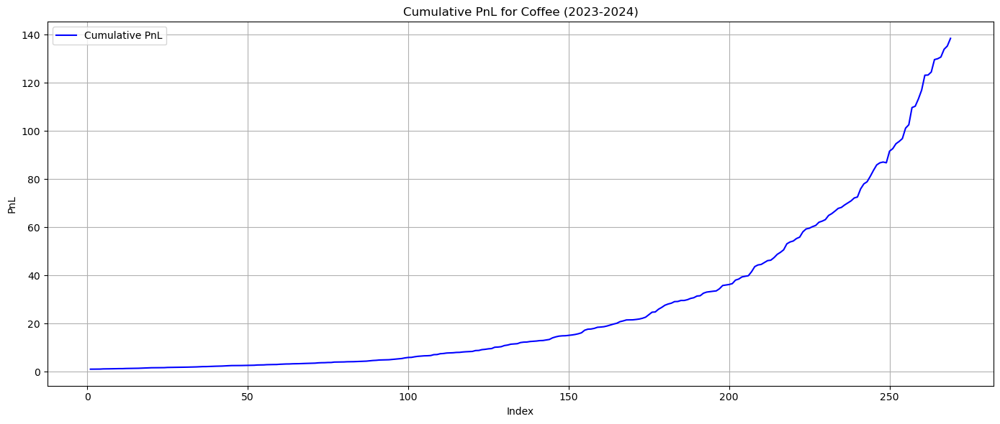

Processing wheat...
Executing trades for wheat...
Signals and PnL data saved for wheat in /Users/avssp/Desktop/commodity_data/signals_with_pnl_wheat.csv


/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hidden_df['Predicted_Close'] = model.predict(X_hidden[model.feature_names_in_])
/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hidden_df['Signal'] = 0
/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a sl

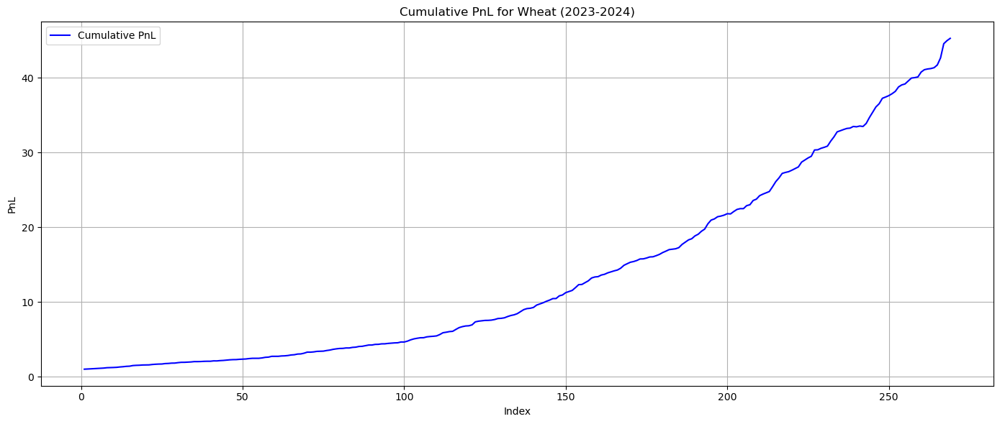

Processing natural_gas...
Executing trades for natural_gas...
Signals and PnL data saved for natural_gas in /Users/avssp/Desktop/commodity_data/signals_with_pnl_natural_gas.csv


/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hidden_df['Predicted_Close'] = model.predict(X_hidden[model.feature_names_in_])
/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hidden_df['Signal'] = 0
/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a sl

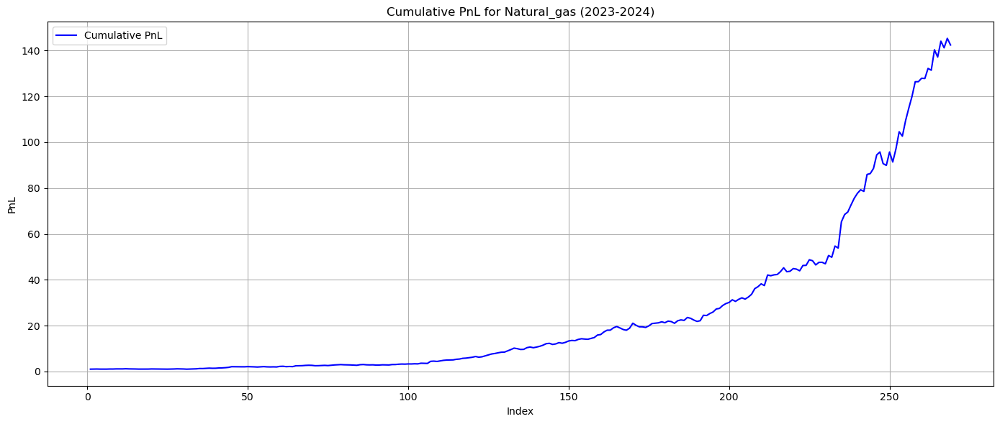

Processing sugar...
Executing trades for sugar...


/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hidden_df['Predicted_Close'] = model.predict(X_hidden[model.feature_names_in_])
/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hidden_df['Signal'] = 0
/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a sl

Signals and PnL data saved for sugar in /Users/avssp/Desktop/commodity_data/signals_with_pnl_sugar.csv


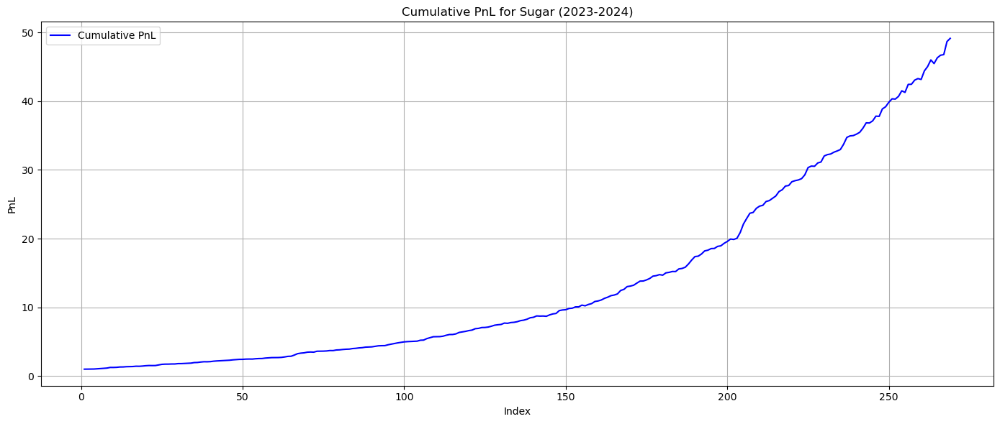

Processing gold...
Executing trades for gold...
Signals and PnL data saved for gold in /Users/avssp/Desktop/commodity_data/signals_with_pnl_gold.csv


/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hidden_df['Predicted_Close'] = model.predict(X_hidden[model.feature_names_in_])
/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hidden_df['Signal'] = 0
/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a sl

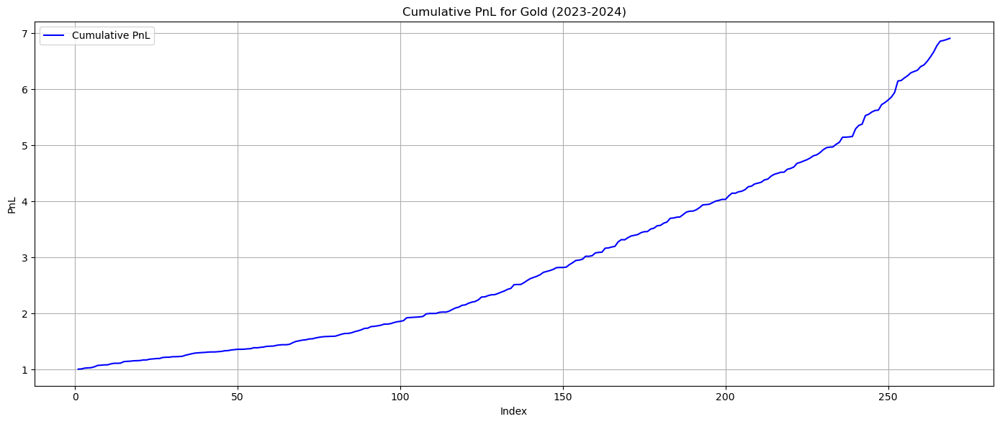

Processing silver...
Executing trades for silver...
Signals and PnL data saved for silver in /Users/avssp/Desktop/commodity_data/signals_with_pnl_silver.csv


/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hidden_df['Predicted_Close'] = model.predict(X_hidden[model.feature_names_in_])
/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hidden_df['Signal'] = 0
/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a sl

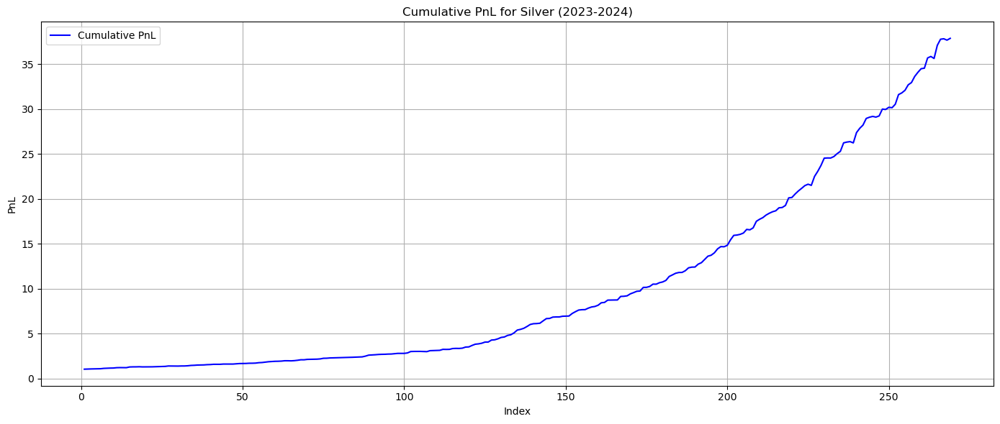

Processing cotton...
Executing trades for cotton...
Signals and PnL data saved for cotton in /Users/avssp/Desktop/commodity_data/signals_with_pnl_cotton.csv


/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hidden_df['Predicted_Close'] = model.predict(X_hidden[model.feature_names_in_])
/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hidden_df['Signal'] = 0
/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a sl

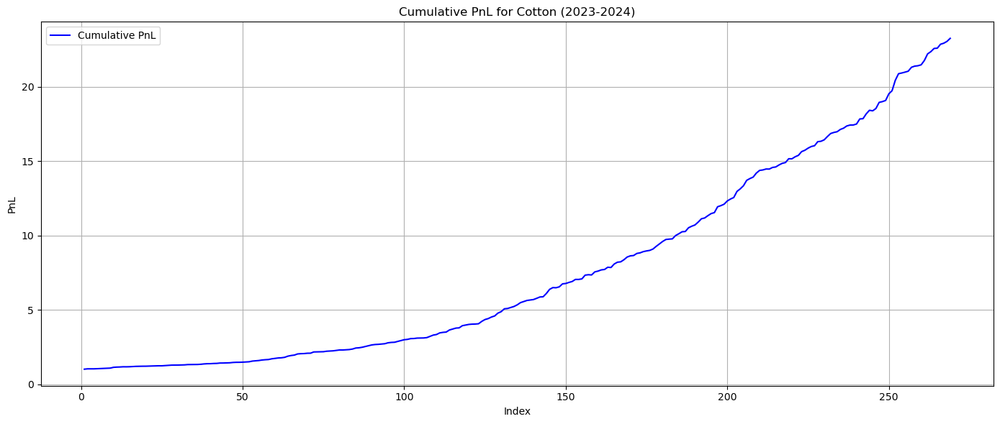

Processing copper...
Executing trades for copper...
Signals and PnL data saved for copper in /Users/avssp/Desktop/commodity_data/signals_with_pnl_copper.csv


/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hidden_df['Predicted_Close'] = model.predict(X_hidden[model.feature_names_in_])
/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hidden_df['Signal'] = 0
/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a sl

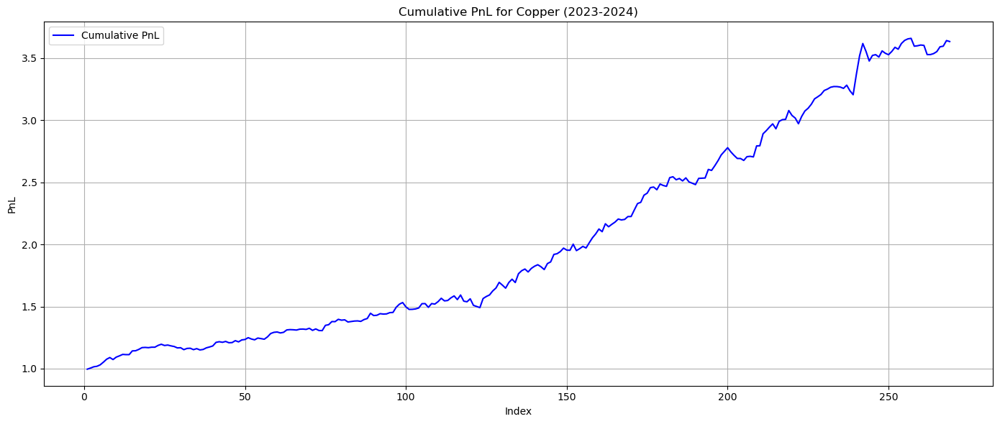

Processing corn...
Executing trades for corn...
Signals and PnL data saved for corn in /Users/avssp/Desktop/commodity_data/signals_with_pnl_corn.csv


/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hidden_df['Predicted_Close'] = model.predict(X_hidden[model.feature_names_in_])
/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hidden_df['Signal'] = 0
/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a sl

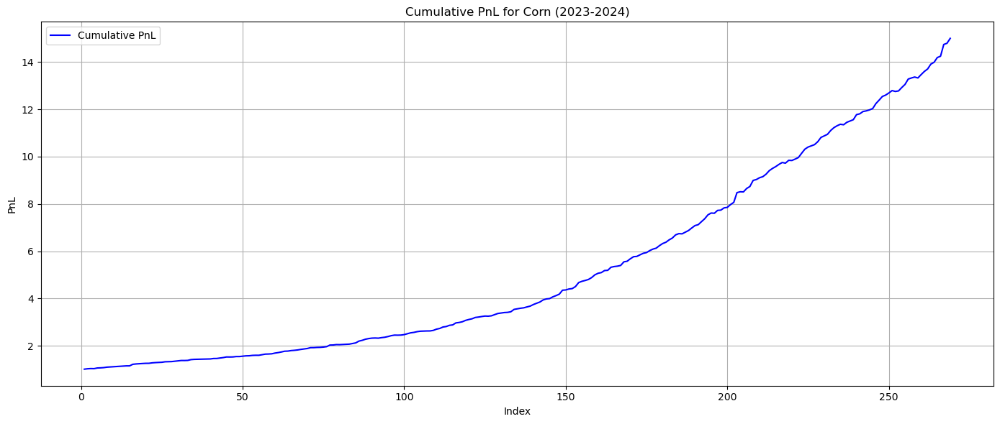

Processing crude_oil...
Executing trades for crude_oil...
Signals and PnL data saved for crude_oil in /Users/avssp/Desktop/commodity_data/signals_with_pnl_crude_oil.csv


/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hidden_df['Predicted_Close'] = model.predict(X_hidden[model.feature_names_in_])
/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hidden_df['Signal'] = 0
/var/folders/l_/j4rfg9014yvd4jfvv441w26r0000gn/T/ipykernel_46779/580114365.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a sl

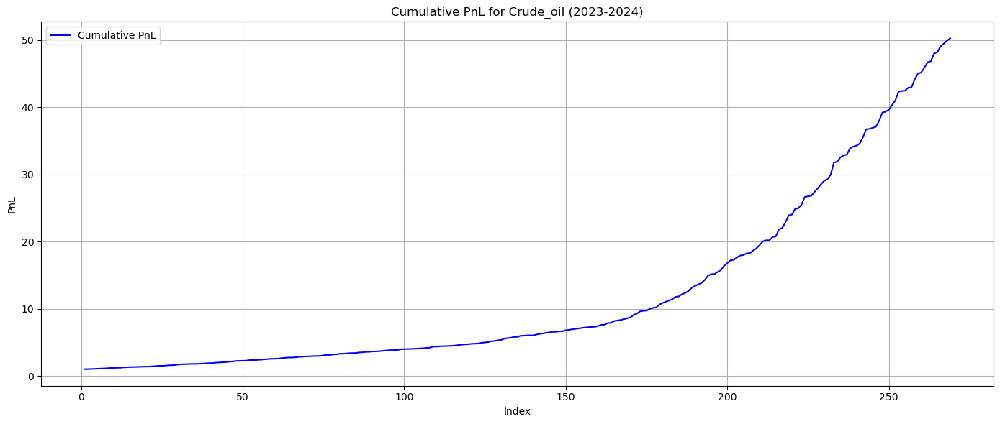

In [49]:
final_results=[]

for hidden_file in hidden_files:
    commodity_name = hidden_file.replace("xgboost_hidden_data_", "").replace(".csv", "")
    file_path = os.path.join(hidden_data_dir, hidden_file)

    if os.path.exists(file_path):
        print(f"Processing {commodity_name}...")

        # Load the hidden data
        hidden_df = pd.read_csv(file_path)

        # Create 'Future_Close' column if it doesn't exist
        if 'Future_Close' not in hidden_df.columns:
            hidden_df['Future_Close'] = hidden_df['Close'].shift(-1)  # Shift the 'Close' column

        # Drop rows with missing 'Future_Close' values (last row in the dataset)
        hidden_df = hidden_df.dropna(subset=['Future_Close'])

        # Ensure the fine-tuned model is loaded
        model_file = f"finetuned_xgboost_predictions_{commodity_name}.csv"
        model_path = os.path.join(hidden_data_dir, model_file)
        if os.path.exists(model_path):
            # Train the model on usable data
            df = pd.read_csv(model_path)

            # Create 'Future_Close' for the model training dataset if not present
            if 'Future_Close' not in df.columns:
                df['Future_Close'] = df['Close'].shift(-1)
            df = df.dropna(subset=['Future_Close'])

            # Select only numeric columns and exclude non-feature columns
            X = df.drop(columns=['Future_Close', 'Actual_Close', 'Predicted_Close'], errors='ignore')
            X = X.select_dtypes(include=[np.number])  # Keep only numeric columns
            y = df['Future_Close']

            # Retrain the model with fine-tuned parameters
            model = XGBRegressor(**{
                'n_estimators': 300,
                'max_depth': 7,
                'learning_rate': 0.03,
                'subsample': 0.75,
                'colsample_bytree': 0.8,
                'gamma': 0.1
            })
            model.fit(X, y)


            # Execute trading logic
            hidden_df = trading_execution(hidden_df, model, commodity_name)

            # Plot and save PnL chart
            plot_pnl(hidden_df, commodity_name)

            # Append final cumulative return for summary
            final_pnl = hidden_df['Cumulative_PnL'].iloc[-1] - 1
            final_results.append({"Commodity": commodity_name, "Final_PnL (%)": final_pnl})
        else:
            print(f"Model not found for {commodity_name}")
    else:
        print(f"File not found: {file_path}")


In [50]:
# Display final results
final_results_df = pd.DataFrame(final_results)
print("\n--- Final Trading Results for All Commodities ---")
print(final_results_df)

# Save final results to CSV
final_results_df.to_csv(os.path.join(hidden_data_dir, "final_trading_results.csv"), index=False)



--- Final Trading Results for All Commodities ---
     Commodity  Final_PnL (%)
0       coffee     137.531491
1        wheat      44.285372
2  natural_gas     141.415535
3        sugar      48.146013
4         gold       5.911428
5       silver      36.888675
6       cotton      22.267282
7       copper       2.633994
8         corn      13.997813
9    crude_oil      49.243255
[CV] END colsample_bytree=0.7, gamma=0.5, learning_rate=0.07, max_depth=3, n_estimators=200, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.7, gamma=0.5, learning_rate=0.07, max_depth=3, n_estimators=200, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.7, gamma=0.5, learning_rate=0.07, max_depth=3, n_estimators=200, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.7, gamma=0.5, learning_rate=0.07, max_depth=3, n_estimators=200, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.7, gamma=0.5, learning_rate=0.07, max_depth=3, n_estimators=300, subsample=0.7; tot